# `l2hmc`: Example

<a href="https://arxiv.org/abs/2105.03418"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2105.03418-B31B1B.svg" align="left"></a> <a href="https://arxiv.org/abs/2112.01582"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2112.01582-B31B1B.svg" align="left" style="margin-left:10px;"></a><br>


This notebook will (attempt) to walk through the steps needed to successfully instantiate and "run" an experiment.

For this example, we wish to train the L2HMC sampler for the 2D $U(1)$ lattice gauge model with Wilson action:

$$
S_{\beta}(n) = \beta \sum_{n}\sum_{\mu<\nu}\mathrm{Re}\left[1 - U_{\mu\nu}(n) \right]
$$

This consists of the following steps:
  1. Build an `Experiment` by parsing our configuration object
  2. Train our model using the `Experiment.train()` method
  3. Evaluate our trained model `Experiment.evaluate(job_type='eval')`
  4. Compare our trained models' performance against generic HMC `Experiment.evaluate(job_type='hmc')`
  

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Evaluating Performance</u></b>
    
Explicitly, we measure the performance of our model by comparing the _tunneling rate_ $\delta Q$ of our **trained** sampler to that of generic HMC.
    
Explicitly, the tunneling rate is given by:
    
$$
\delta Q = \frac{1}{N_{\mathrm{chains}}}\sum_{\mathrm{chains}} \left|Q_{i+1} - Q_{i}\right|
$$
    
where the difference is between subsequent states in a chain, and the sum is over all $N$ chains (each being ran in parallel, _independently_).
    
Since our goal is to generate _independent configurations_, the more our sampler tunnels between different topological sectors (_tunneling rate_), the more efficient our sampler.
    
</div>


## Imports

In [1]:
import os
print(os.environ['CUDA_VISIBLE_DEVICES'])
!getconf _NPROCESSORS_ONLN

7
256


In [2]:
os.environ['OMP_NUM_THREADS'] = '256'

In [3]:
import warnings
warnings.filterwarnings('ignore')
os.environ['TORCH_CPP_LOG_LEVEL'] = 'ERROR'

In [4]:
from __future__ import absolute_import, print_function, annotations, division

# automatically detect and reload local changes to modules
%load_ext autoreload
%autoreload 2

# unset verbose TF XLA Flags
!unset TF_XLA_FLAGS
!unset KMP_AFFINITY KMP_SETTINGS

import os

import hydra
import torch
import tensorflow as tf
import numpy as np
    
from l2hmc.main import setup, setup_tensorflow, setup_torch

_ = setup_torch(
    precision='float32',
    seed=1234,
)

_ = setup_tensorflow(
    precision='float32',
)

from hydra.core.global_hydra import GlobalHydra
from l2hmc.utils.rich import print_config

--------------------------------------------------------------------------

  Local host:   thetagpu08
  Local device: mlx5_0
--------------------------------------------------------------------------
Using: float32 precision


In [5]:
import warnings
import logging
from rich.style import Style
from rich.console import Console
from rich.logging import RichHandler
from l2hmc.utils.rich import get_console

warnings.filterwarnings('always')

log = logging.getLogger()
log.setLevel('INFO')

tlog = logging.getLogger('torch')
tlog.setLevel('ERROR')

wblog = logging.getLogger('wandb')
wblog.setLevel('CRITICAL')

console = get_console()

handler = RichHandler(
    console=console,
    show_path=False,
    markup=True,
    rich_tracebacks=True,
)
log.handlers = [handler]

# `ExperimentConfig`

Set some reasonable defaults for our experiments

In [6]:
#GlobalHydra.instance().clear()

defaults = [
    'steps.nera=5',
    'steps.nepoch=1000',
    'steps.test=2000',
    'steps.print=250',
    'steps.log=20',
]

defaults_u1 = [
    *defaults,
    'dynamics.nchains=2048',
    'dynamics.nleapfrog=5',
    'dynamics.latvolume=[16, 16]',
    'conv.filters=[16, 32, 64]',
    'conv.sizes=[3, 3, 3]',
    'conv.pool=[2, 2, 2]',
    'network.units=[16, 16, 16, 16]',
    'annealing_schedule.beta_init=1.0',
    'annealing_schedule.beta_final=5.0',
]

defaults_su3 = [
    *defaults,
    'dynamics=su3',
    'dynamics.nchains=5',
    'steps.nera=0',
    'steps.nepoch=0',
    'dynamics.latvolume=[8, 8, 8, 16]',
    'annealing_schedule.beta_init=0.7796',
    'annealing_schedule.beta_final=0.7796',
]

In [7]:
outputs = {
    'pytorch': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
    'tensorflow': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
}

# Initialize and Build `Experiment` objects:

- The `l2hmc.configs` module provides a function `get_experiment`:

```python
def get_experiment(overrides: list[str]) -> Experiment:
    ...
```

which will:

1. Load the default options from `conf/config.yaml`
2. Override the default options with any values provided in `overrides`
3. Parse these options and build an `ExperimentConfig` which uniquely defines an experiment
3. Instantiate / return an `Experiment` from the `ExperimentConfig`

```python
>>> train_output = experiment.train()
>>> eval_output = experiment.evaluate(job_type='eval')
>>> hmc_output = experiment.evaluate(job_type='hmc')
```

>[!note]<br>
> Specifics about the training / evaluation / hmc runs can be flexibly overridden by passing arguments to the training / evaluation / hmc runs

In [8]:
import gc
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

In [9]:
from l2hmc.configs import get_experiment

ptExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=pytorch',
        'init_wandb=false',
        'init_aim=false',
    ]
)

/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/utils/tensorboard/__init__.py:4: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if not hasattr(tensorboard, "__version__") or LooseVersion(
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/utils/tensorboard/__init__.py:6: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  ) < LooseVersion("1.15"):


[10/24/22 14:47:37] INFO     Using horovod for distributed training

/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch

/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new

/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new

[10/24/22 14:47:43] WARNING  No checkpoints found to load from

                    WARNING  Using `torch.optim.Adam` optimizer

                    INFO     Using horovod for distributed training

In [10]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
        'init_wandb=false',
        'init_aim=false',
    ]
)

## PyTorch

In [ ]:
import warnings
import seaborn as sns

warnings.filterwarnings('ignore')
#beta = 4 * [1.0] + [3.0] + [4.0] + 4 * [5.0]
#beta = np.linspace(2.0, 5.0, num=10).tolist()
with sns.plotting_context("talk"):
    outputs['pytorch']['train'] = ptExpU1.train()

─────────────────────────────────────────────── ERA: 0 / 5, BETA: 1.000 ────────────────────────────────────────────────

[10/24/22 14:48:04] INFO     era=0   epoch=0   tstep=0   dt=1.7894 beta=1.0000 loss=-264.6780 dQsin=0.9338 dQint=2.2563 
                             energy=511.9907 logprob=511.8873 logdet=0.1034 sldf=0.3748 sldb=-0.3875 sld=0.1034         
                             xeps=0.1000 veps=0.1000 acc=0.5084 sumlogdet=-0.0006 acc_mask=0.5083 plaqs=-0.0005         
                             intQ=0.1479 sinQ=0.0492 lr=0.0010

[10/24/22 14:52:29] INFO     era=0   epoch=250 tstep=250 dt=0.5457 beta=1.0000 loss=-437.9796 dQsin=1.5956 dQint=2.9565 
                             energy=398.2011 logprob=397.8683 logdet=0.3328 sldf=0.9036 sldb=-0.9056 sld=0.3328         
                             xeps=0.1401 veps=0.1408 acc=0.9028 sumlogdet=-0.0013 acc_mask=0.9014 plaqs=0.4458          
                             intQ=0.0049 sinQ=0.0025 lr=0.0010

[10/24/22 14:57:30] INFO     era=0   epoch=500 tstep=500 dt=0.5466 beta=1.0000 loss=-559.8489 dQsin=1.7727 dQint=3.2256 
                             energy=397.8995 logprob=397.6290 logdet=0.2706 sldf=0.6645 sldb=-0.6633 sld=0.2706         
                             xeps=0.1818 veps=0.1825 acc=0.8871 sumlogdet=0.0011 acc_mask=0.8848 plaqs=0.4471           
                             intQ=-0.0303 sinQ=0.0130 lr=0.0010

[10/24/22 15:01:57] INFO     era=0   epoch=750 tstep=750 dt=0.5480 beta=1.0000 loss=-607.8478 dQsin=1.8458 dQint=3.2900 
                             energy=398.7000 logprob=398.4740 logdet=0.2259 sldf=0.5918 sldb=-0.5923 sld=0.2259         
                             xeps=0.2029 veps=0.2028 acc=0.8980 sumlogdet=-0.0001 acc_mask=0.8853 plaqs=0.4464          
                             intQ=0.0942 sinQ=-0.0049 lr=0.0010

[10/24/22 15:06:13] INFO     Saving took: 0.00117278s

                    INFO     Era 0 took: 1101.61s

─────────────────────────────────────────────── ERA: 1 / 5, BETA: 2.000 ────────────────────────────────────────────────

[10/24/22 15:06:24] INFO     era=1   epoch=0   tstep=1000 dt=0.5467 beta=2.0000 loss=-550.3229 dQsin=1.7869 dQint=3.1250
                             energy=540.5356 logprob=540.3380 logdet=0.1976 sldf=0.4980 sldb=-0.4983 sld=0.1976         
                             xeps=0.2150 veps=0.2141 acc=0.8828 sumlogdet=0.0001 acc_mask=0.8896 plaqs=0.4451           
                             intQ=0.0298 sinQ=-0.0116 lr=0.0010

[10/24/22 15:10:51] INFO     era=1   epoch=250 tstep=1250 dt=0.5418 beta=2.0000 loss=-273.6603 dQsin=1.2153 dQint=1.7617
                             energy=411.8173 logprob=411.6263 logdet=0.1910 sldf=0.4828 sldb=-0.4832 sld=0.1910         
                             xeps=0.2163 veps=0.2152 acc=0.8411 sumlogdet=0.0001 acc_mask=0.8472 plaqs=0.6975           
                             intQ=-0.0234 sinQ=-0.0227 lr=0.0010

[10/24/22 15:15:12] INFO     era=1   epoch=500 tstep=1500 dt=0.5406 beta=2.0000 loss=-283.3582 dQsin=1.2664 dQint=1.7827
                             energy=411.0073 logprob=410.8086 logdet=0.1988 sldf=0.4723 sldb=-0.4734 sld=0.1988         
                             xeps=0.2217 veps=0.2195 acc=0.8479 sumlogdet=-0.0007 acc_mask=0.8530 plaqs=0.6982          
                             intQ=0.0420 sinQ=0.0188 lr=0.0010

[10/24/22 15:19:35] INFO     era=1   epoch=750 tstep=1750 dt=0.5408 beta=2.0000 loss=-279.5641 dQsin=1.2317 dQint=1.7471
                             energy=412.1467 logprob=411.9565 logdet=0.1901 sldf=0.4252 sldb=-0.4259 sld=0.1901         
                             xeps=0.2271 veps=0.2252 acc=0.8462 sumlogdet=-0.0001 acc_mask=0.8496 plaqs=0.6973          
                             intQ=-0.0229 sinQ=-0.0260 lr=0.0010

[10/24/22 15:23:47] INFO     Saving took: 0.00110626s

                    INFO     Era 1 took: 1053.6s

                    INFO     Avgs over last era:                                                                        
                              tstep=1490.3846, dt=0.5421, beta=2.0000, loss=-287.8346, dQsin=1.2380, dQint=1.7786,      
                             energy=414.3182, logprob=414.1271, logdet=0.1912, sldf=0.4520, sldb=-0.4523, sld=0.1912,   
                             xeps=0.2218, veps=0.2202, acc=0.8408, sumlogdet=0.0000, acc_mask=0.8408, plaqs=0.6928,     
                             intQ=0.0008, sinQ=-0.0011, lr=0.0010                                                       
                    

─────────────────────────────────────────────── ERA: 2 / 5, BETA: 3.000 ────────────────────────────────────────────────

[10/24/22 15:23:57] INFO     era=2   epoch=0   tstep=2000 dt=0.5400 beta=3.0000 loss=-214.0302 dQsin=1.0281 dQint=1.3721
                             energy=489.9052 logprob=489.7159 logdet=0.1892 sldf=0.3852 sldb=-0.3850 sld=0.1892         
                             xeps=0.2326 veps=0.2295 acc=0.7808 sumlogdet=0.0003 acc_mask=0.7793 plaqs=0.6978           
                             intQ=0.0151 sinQ=-0.0087 lr=0.0010

In [14]:
outputs['pytorch']['eval'] = ptExpU1.evaluate(job_type='eval', nchains=128)

[10/24/22 13:34:28] WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])

                    WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])

                    INFO     eps=None                                                                                   
                             beta=5.0                                                                                   
                             nlog=10                                                                                    
                             table=<rich.table.Table object at 0x7fb4a4340a90>                                          
                             nprint=40                                                                                  
                             eval_steps=2000                                                                            
                             nleapfrog=None

  2%|▏         | 40/2000 [00:04<02:34, 12.72it/s]

[10/24/22 13:34:33] INFO     estep=40  dt=0.0804 beta=5.0000 loss=2.9622 dQsin=0.1574 dQint=0.0156 energy=398.1498      
                             logprob=398.1666 logdet=-0.0169 sldf=-0.1278 sldb=0.1303 sld=-0.0169 xeps=0.1658           
                             veps=0.1613 acc=0.8643 sumlogdet=0.0023 acc_mask=0.8125 plaqs=0.8910 intQ=-0.0703          
                             sinQ=-0.0624

  4%|▍         | 80/2000 [00:07<02:31, 12.66it/s]

[10/24/22 13:34:36] INFO     estep=80  dt=0.0768 beta=5.0000 loss=0.1988 dQsin=0.1656 dQint=0.0469 energy=395.0189      
                             logprob=395.0391 logdet=-0.0201 sldf=-0.1317 sldb=0.1268 sld=-0.0201 xeps=0.1658           
                             veps=0.1613 acc=0.8747 sumlogdet=-0.0032 acc_mask=0.8359 plaqs=0.8931 intQ=-0.0703         
                             sinQ=-0.0528

  6%|▌         | 120/2000 [00:11<02:28, 12.65it/s]

[10/24/22 13:34:39] INFO     estep=120 dt=0.0768 beta=5.0000 loss=1.5268 dQsin=0.1433 dQint=0.0313 energy=395.4878      
                             logprob=395.5068 logdet=-0.0191 sldf=-0.1300 sldb=0.1275 sld=-0.0191 xeps=0.1658           
                             veps=0.1613 acc=0.8630 sumlogdet=-0.0014 acc_mask=0.8594 plaqs=0.8937 intQ=-0.0937         
                             sinQ=-0.0842

  8%|▊         | 160/2000 [00:14<02:25, 12.64it/s]

[10/24/22 13:34:43] INFO     estep=160 dt=0.0768 beta=5.0000 loss=2.2268 dQsin=0.1610 dQint=0.0313 energy=398.2501      
                             logprob=398.2651 logdet=-0.0150 sldf=-0.1226 sldb=0.1269 sld=-0.0150 xeps=0.1658           
                             veps=0.1613 acc=0.8852 sumlogdet=0.0040 acc_mask=0.9297 plaqs=0.8929 intQ=-0.0859          
                             sinQ=-0.0573

 10%|█         | 200/2000 [00:17<02:22, 12.67it/s]

[10/24/22 13:34:46] INFO     estep=200 dt=0.0773 beta=5.0000 loss=2.7537 dQsin=0.1329 dQint=0.0078 energy=396.1574      
                             logprob=396.1765 logdet=-0.0191 sldf=-0.1332 sldb=0.1316 sld=-0.0191 xeps=0.1658           
                             veps=0.1613 acc=0.8942 sumlogdet=-0.0016 acc_mask=0.8594 plaqs=0.8936 intQ=-0.1250         
                             sinQ=-0.0888

 12%|█▏        | 240/2000 [00:21<02:19, 12.64it/s]

[10/24/22 13:34:49] INFO     estep=240 dt=0.0768 beta=5.0000 loss=5.2107 dQsin=0.1413 dQint=0.0234 energy=396.5630      
                             logprob=396.5791 logdet=-0.0161 sldf=-0.1231 sldb=0.1248 sld=-0.0161 xeps=0.1658           
                             veps=0.1613 acc=0.9007 sumlogdet=0.0033 acc_mask=0.8906 plaqs=0.8927 intQ=0.0313           
                             sinQ=0.0286

 14%|█▍        | 280/2000 [00:24<02:15, 12.69it/s]

[10/24/22 13:34:52] INFO     estep=280 dt=0.0792 beta=5.0000 loss=1.1522 dQsin=0.1522 dQint=0.0234 energy=397.5625      
                             logprob=397.5798 logdet=-0.0173 sldf=-0.1296 sldb=0.1299 sld=-0.0173 xeps=0.1658           
                             veps=0.1613 acc=0.8878 sumlogdet=0.0003 acc_mask=0.8984 plaqs=0.8937 intQ=-0.0781          
                             sinQ=-0.0540

 16%|█▌        | 320/2000 [00:27<02:12, 12.64it/s]

[10/24/22 13:34:55] INFO     estep=320 dt=0.0770 beta=5.0000 loss=3.7722 dQsin=0.1360 dQint=0.0234 energy=395.3450      
                             logprob=395.3633 logdet=-0.0183 sldf=-0.1310 sldb=0.1296 sld=-0.0183 xeps=0.1658           
                             veps=0.1613 acc=0.8754 sumlogdet=0.0007 acc_mask=0.9141 plaqs=0.8947 intQ=-0.1016          
                             sinQ=-0.0861

 18%|█▊        | 360/2000 [00:30<02:08, 12.72it/s]

[10/24/22 13:34:59] INFO     estep=360 dt=0.0769 beta=5.0000 loss=-2.7851 dQsin=0.1643 dQint=0.0391 energy=395.6852     
                             logprob=395.7009 logdet=-0.0157 sldf=-0.1225 sldb=0.1241 sld=-0.0157 xeps=0.1658           
                             veps=0.1613 acc=0.8953 sumlogdet=0.0020 acc_mask=0.9219 plaqs=0.8922 intQ=-0.1172          
                             sinQ=-0.1124

 20%|██        | 400/2000 [00:33<02:05, 12.74it/s]

[10/24/22 13:35:02] INFO     estep=400 dt=0.0773 beta=5.0000 loss=-0.5963 dQsin=0.1384 dQint=0.0234 energy=397.0689     
                             logprob=397.0863 logdet=-0.0175 sldf=-0.1251 sldb=0.1252 sld=-0.0175 xeps=0.1658           
                             veps=0.1613 acc=0.8489 sumlogdet=-0.0003 acc_mask=0.8594 plaqs=0.8922 intQ=-0.1875         
                             sinQ=-0.1470

 22%|██▏       | 440/2000 [00:37<02:03, 12.64it/s]

[10/24/22 13:35:05] INFO     estep=440 dt=0.0769 beta=5.0000 loss=1.2222 dQsin=0.1576 dQint=0.0391 energy=394.0283      
                             logprob=394.0454 logdet=-0.0171 sldf=-0.1307 sldb=0.1329 sld=-0.0171 xeps=0.1658           
                             veps=0.1613 acc=0.8734 sumlogdet=0.0016 acc_mask=0.8672 plaqs=0.8941 intQ=-0.0625          
                             sinQ=-0.0391

 24%|██▍       | 480/2000 [00:40<01:59, 12.70it/s]

[10/24/22 13:35:08] INFO     estep=480 dt=0.0767 beta=5.0000 loss=2.1245 dQsin=0.1432 dQint=0.0234 energy=400.6579      
                             logprob=400.6748 logdet=-0.0168 sldf=-0.1278 sldb=0.1297 sld=-0.0168 xeps=0.1658           
                             veps=0.1613 acc=0.8711 sumlogdet=0.0013 acc_mask=0.8906 plaqs=0.8918 intQ=0.0313           
                             sinQ=0.0176

 26%|██▌       | 520/2000 [00:43<01:56, 12.70it/s]

[10/24/22 13:35:11] INFO     estep=520 dt=0.0769 beta=5.0000 loss=2.3801 dQsin=0.1488 dQint=0.0078 energy=397.7043      
                             logprob=397.7205 logdet=-0.0162 sldf=-0.1220 sldb=0.1230 sld=-0.0162 xeps=0.1658           
                             veps=0.1613 acc=0.8628 sumlogdet=0.0020 acc_mask=0.8906 plaqs=0.8917 intQ=0.0391           
                             sinQ=0.0278

 28%|██▊       | 560/2000 [00:46<01:59, 12.09it/s]

[10/24/22 13:35:15] INFO     estep=560 dt=0.0770 beta=5.0000 loss=1.0384 dQsin=0.1446 dQint=0.0078 energy=394.5056      
                             logprob=394.5224 logdet=-0.0168 sldf=-0.1270 sldb=0.1279 sld=-0.0168 xeps=0.1658           
                             veps=0.1613 acc=0.8915 sumlogdet=0.0001 acc_mask=0.8672 plaqs=0.8929 intQ=-0.1484          
                             sinQ=-0.1203

 30%|███       | 600/2000 [00:50<01:50, 12.69it/s]

[10/24/22 13:35:18] INFO     estep=600 dt=0.0790 beta=5.0000 loss=0.9966 dQsin=0.1555 dQint=0.0234 energy=393.1895      
                             logprob=393.2056 logdet=-0.0161 sldf=-0.1259 sldb=0.1275 sld=-0.0161 xeps=0.1658           
                             veps=0.1613 acc=0.8986 sumlogdet=0.0014 acc_mask=0.8906 plaqs=0.8933 intQ=-0.0703          
                             sinQ=-0.0369

 32%|███▏      | 640/2000 [00:53<01:53, 11.96it/s]

[10/24/22 13:35:22] INFO     estep=640 dt=0.0785 beta=5.0000 loss=2.1354 dQsin=0.1398 dQint=0.0234 energy=395.8122      
                             logprob=395.8322 logdet=-0.0200 sldf=-0.1371 sldb=0.1348 sld=-0.0200 xeps=0.1658           
                             veps=0.1613 acc=0.8696 sumlogdet=-0.0035 acc_mask=0.8203 plaqs=0.8942 intQ=0.0469          
                             sinQ=0.0419

 34%|███▍      | 680/2000 [00:57<01:46, 12.41it/s]

[10/24/22 13:35:25] INFO     estep=680 dt=0.0783 beta=5.0000 loss=1.3790 dQsin=0.1480 dQint=0.0391 energy=395.6050      
                             logprob=395.6242 logdet=-0.0192 sldf=-0.1337 sldb=0.1312 sld=-0.0192 xeps=0.1658           
                             veps=0.1613 acc=0.8705 sumlogdet=-0.0022 acc_mask=0.8828 plaqs=0.8929 intQ=-0.0078         
                             sinQ=-0.0144

 36%|███▌      | 720/2000 [01:00<01:43, 12.39it/s]

[10/24/22 13:35:28] INFO     estep=720 dt=0.0831 beta=5.0000 loss=1.6013 dQsin=0.1416 dQint=0.0156 energy=394.2982      
                             logprob=394.3156 logdet=-0.0174 sldf=-0.1261 sldb=0.1269 sld=-0.0174 xeps=0.1658           
                             veps=0.1613 acc=0.8817 sumlogdet=0.0003 acc_mask=0.8906 plaqs=0.8922 intQ=-0.0391          
                             sinQ=-0.0309

 38%|███▊      | 760/2000 [01:03<01:40, 12.31it/s]

[10/24/22 13:35:32] INFO     estep=760 dt=0.0785 beta=5.0000 loss=2.5003 dQsin=0.1429 dQint=0.0313 energy=393.1668      
                             logprob=393.1816 logdet=-0.0148 sldf=-0.1249 sldb=0.1299 sld=-0.0148 xeps=0.1658           
                             veps=0.1613 acc=0.8829 sumlogdet=0.0040 acc_mask=0.8828 plaqs=0.8943 intQ=-0.0547          
                             sinQ=-0.0397

 40%|████      | 800/2000 [01:07<01:37, 12.33it/s]

[10/24/22 13:35:35] INFO     estep=800 dt=0.0782 beta=5.0000 loss=2.5045 dQsin=0.1298 dQint=0.0156 energy=395.3462      
                             logprob=395.3610 logdet=-0.0148 sldf=-0.1215 sldb=0.1256 sld=-0.0148 xeps=0.1658           
                             veps=0.1613 acc=0.8759 sumlogdet=0.0037 acc_mask=0.8750 plaqs=0.8934 intQ=-0.0937          
                             sinQ=-0.0810

 42%|████▏     | 840/2000 [01:10<01:33, 12.35it/s]

[10/24/22 13:35:38] INFO     estep=840 dt=0.0784 beta=5.0000 loss=2.8069 dQsin=0.1442 dQint=0.0156 energy=395.9645      
                             logprob=395.9804 logdet=-0.0160 sldf=-0.1202 sldb=0.1211 sld=-0.0160 xeps=0.1658           
                             veps=0.1613 acc=0.8953 sumlogdet=0.0010 acc_mask=0.8438 plaqs=0.8923 intQ=0.0391           
                             sinQ=0.0452

 44%|████▍     | 880/2000 [01:13<01:30, 12.37it/s]

[10/24/22 13:35:42] INFO     estep=880 dt=0.0784 beta=5.0000 loss=1.9923 dQsin=0.1448 dQint=0.0078 energy=396.5466      
                             logprob=396.5615 logdet=-0.0149 sldf=-0.1236 sldb=0.1280 sld=-0.0149 xeps=0.1658           
                             veps=0.1613 acc=0.8808 sumlogdet=0.0056 acc_mask=0.8672 plaqs=0.8928 intQ=0.0625           
                             sinQ=0.0613

 46%|████▌     | 920/2000 [01:16<01:27, 12.34it/s]

[10/24/22 13:35:45] INFO     estep=920 dt=0.0790 beta=5.0000 loss=0.8727 dQsin=0.1538 dQint=0.0391 energy=390.3177      
                             logprob=390.3334 logdet=-0.0157 sldf=-0.1246 sldb=0.1277 sld=-0.0157 xeps=0.1658           
                             veps=0.1613 acc=0.8643 sumlogdet=0.0032 acc_mask=0.8750 plaqs=0.8936 intQ=0.1094           
                             sinQ=0.0838

 48%|████▊     | 960/2000 [01:20<01:24, 12.36it/s]

[10/24/22 13:35:48] INFO     estep=960 dt=0.0784 beta=5.0000 loss=3.8431 dQsin=0.1304 dQint=0.0078 energy=391.2738      
                             logprob=391.2912 logdet=-0.0174 sldf=-0.1320 sldb=0.1324 sld=-0.0174 xeps=0.1658           
                             veps=0.1613 acc=0.8705 sumlogdet=0.0009 acc_mask=0.8594 plaqs=0.8938 intQ=0.1172           
                             sinQ=0.0935

 50%|█████     | 1000/2000 [01:23<01:33, 10.73it/s]

[10/24/22 13:35:52] INFO     estep=1000 dt=0.0798 beta=5.0000 loss=3.1030 dQsin=0.1278 dQint=0.0078 energy=393.9409     
                             logprob=393.9586 logdet=-0.0177 sldf=-0.1321 sldb=0.1325 sld=-0.0177 xeps=0.1658           
                             veps=0.1613 acc=0.8884 sumlogdet=0.0002 acc_mask=0.8750 plaqs=0.8939 intQ=0.0625           
                             sinQ=0.0628

 52%|█████▏    | 1040/2000 [01:26<01:17, 12.42it/s]

[10/24/22 13:35:55] INFO     estep=1040 dt=0.0783 beta=5.0000 loss=2.1232 dQsin=0.1483 dQint=0.0078 energy=395.3850     
                             logprob=395.4005 logdet=-0.0155 sldf=-0.1233 sldb=0.1257 sld=-0.0155 xeps=0.1658           
                             veps=0.1613 acc=0.8875 sumlogdet=0.0024 acc_mask=0.9141 plaqs=0.8930 intQ=0.0938           
                             sinQ=0.1057

 54%|█████▍    | 1080/2000 [01:30<01:14, 12.40it/s]

[10/24/22 13:35:58] INFO     estep=1080 dt=0.0785 beta=5.0000 loss=2.7778 dQsin=0.1510 dQint=0.0234 energy=394.5835     
                             logprob=394.6014 logdet=-0.0179 sldf=-0.1279 sldb=0.1262 sld=-0.0179 xeps=0.1658           
                             veps=0.1613 acc=0.8784 sumlogdet=-0.0030 acc_mask=0.8516 plaqs=0.8932 intQ=0.0547          
                             sinQ=0.0446

 56%|█████▌    | 1120/2000 [01:33<01:11, 12.34it/s]

[10/24/22 13:36:02] INFO     estep=1120 dt=0.0787 beta=5.0000 loss=2.7605 dQsin=0.1314 dQint=0.0156 energy=396.1842     
                             logprob=396.2005 logdet=-0.0163 sldf=-0.1239 sldb=0.1261 sld=-0.0163 xeps=0.1658           
                             veps=0.1613 acc=0.8713 sumlogdet=0.0013 acc_mask=0.9062 plaqs=0.8921 intQ=0.0781           
                             sinQ=0.0827

 58%|█████▊    | 1160/2000 [01:36<01:07, 12.36it/s]

[10/24/22 13:36:05] INFO     estep=1160 dt=0.0787 beta=5.0000 loss=2.4415 dQsin=0.1309 dQint=0.0078 energy=394.8396     
                             logprob=394.8570 logdet=-0.0174 sldf=-0.1268 sldb=0.1266 sld=-0.0174 xeps=0.1658           
                             veps=0.1613 acc=0.8665 sumlogdet=0.0002 acc_mask=0.8594 plaqs=0.8946 intQ=-0.0234          
                             sinQ=-0.0284

 60%|██████    | 1200/2000 [01:40<01:05, 12.30it/s]

[10/24/22 13:36:08] INFO     estep=1200 dt=0.0786 beta=5.0000 loss=0.7347 dQsin=0.1591 dQint=0.0234 energy=392.0699     
                             logprob=392.0854 logdet=-0.0155 sldf=-0.1252 sldb=0.1293 sld=-0.0155 xeps=0.1658           
                             veps=0.1613 acc=0.8791 sumlogdet=0.0043 acc_mask=0.8594 plaqs=0.8941 intQ=-0.1641          
                             sinQ=-0.1347

 62%|██████▏   | 1240/2000 [01:43<01:01, 12.42it/s]

[10/24/22 13:36:11] INFO     estep=1240 dt=0.0785 beta=5.0000 loss=3.9851 dQsin=0.1505 dQint=0.0313 energy=395.4201     
                             logprob=395.4383 logdet=-0.0182 sldf=-0.1284 sldb=0.1283 sld=-0.0182 xeps=0.1658           
                             veps=0.1613 acc=0.9110 sumlogdet=0.0013 acc_mask=0.9062 plaqs=0.8928 intQ=-0.1641          
                             sinQ=-0.1357

 64%|██████▍   | 1280/2000 [01:46<00:58, 12.41it/s]

[10/24/22 13:36:15] INFO     estep=1280 dt=0.0785 beta=5.0000 loss=-0.3936 dQsin=0.1565 dQint=0.0313 energy=396.0527    
                             logprob=396.0686 logdet=-0.0159 sldf=-0.1247 sldb=0.1275 sld=-0.0159 xeps=0.1658           
                             veps=0.1613 acc=0.8868 sumlogdet=0.0029 acc_mask=0.8984 plaqs=0.8931 intQ=-0.0391          
                             sinQ=-0.0397

 66%|██████▌   | 1320/2000 [01:50<00:54, 12.39it/s]

[10/24/22 13:36:18] INFO     estep=1320 dt=0.0783 beta=5.0000 loss=1.9520 dQsin=0.1532 dQint=0.0234 energy=396.2248     
                             logprob=396.2436 logdet=-0.0187 sldf=-0.1268 sldb=0.1244 sld=-0.0187 xeps=0.1658           
                             veps=0.1613 acc=0.8668 sumlogdet=-0.0023 acc_mask=0.8516 plaqs=0.8938 intQ=-0.1328         
                             sinQ=-0.1179

 68%|██████▊   | 1360/2000 [01:53<00:51, 12.39it/s]

[10/24/22 13:36:21] INFO     estep=1360 dt=0.0788 beta=5.0000 loss=0.5541 dQsin=0.1620 dQint=0.0313 energy=395.9985     
                             logprob=396.0160 logdet=-0.0175 sldf=-0.1283 sldb=0.1279 sld=-0.0175 xeps=0.1658           
                             veps=0.1613 acc=0.8956 sumlogdet=0.0004 acc_mask=0.8984 plaqs=0.8936 intQ=0.0078           
                             sinQ=0.0237

 70%|███████   | 1400/2000 [01:56<00:57, 10.50it/s]

[10/24/22 13:36:25] INFO     estep=1400 dt=0.1571 beta=5.0000 loss=1.8657 dQsin=0.1654 dQint=0.0313 energy=394.5707     
                             logprob=394.5878 logdet=-0.0171 sldf=-0.1243 sldb=0.1245 sld=-0.0171 xeps=0.1658           
                             veps=0.1613 acc=0.9083 sumlogdet=0.0009 acc_mask=0.9375 plaqs=0.8928 intQ=-0.0937          
                             sinQ=-0.0908

 72%|███████▏  | 1440/2000 [02:00<00:45, 12.41it/s]

[10/24/22 13:36:28] INFO     estep=1440 dt=0.0821 beta=5.0000 loss=3.7852 dQsin=0.1354 dQint=0.0000 energy=392.5122     
                             logprob=392.5287 logdet=-0.0165 sldf=-0.1195 sldb=0.1193 sld=-0.0165 xeps=0.1658           
                             veps=0.1613 acc=0.8593 sumlogdet=0.0013 acc_mask=0.8594 plaqs=0.8950 intQ=-0.1562          
                             sinQ=-0.1435

 74%|███████▍  | 1480/2000 [02:03<00:47, 10.98it/s]

[10/24/22 13:36:32] INFO     estep=1480 dt=0.0790 beta=5.0000 loss=1.8321 dQsin=0.1316 dQint=0.0156 energy=392.5342     
                             logprob=392.5509 logdet=-0.0168 sldf=-0.1272 sldb=0.1275 sld=-0.0168 xeps=0.1658           
                             veps=0.1613 acc=0.8679 sumlogdet=0.0008 acc_mask=0.8438 plaqs=0.8947 intQ=-0.0859          
                             sinQ=-0.0911

 76%|███████▌  | 1520/2000 [02:07<00:39, 12.02it/s]

[10/24/22 13:36:35] INFO     estep=1520 dt=0.0788 beta=5.0000 loss=4.6710 dQsin=0.1304 dQint=0.0156 energy=394.8413     
                             logprob=394.8590 logdet=-0.0178 sldf=-0.1298 sldb=0.1300 sld=-0.0178 xeps=0.1658           
                             veps=0.1613 acc=0.8864 sumlogdet=0.0005 acc_mask=0.8516 plaqs=0.8943 intQ=-0.1250          
                             sinQ=-0.1031

 78%|███████▊  | 1560/2000 [02:10<00:35, 12.41it/s]

[10/24/22 13:36:38] INFO     estep=1560 dt=0.0781 beta=5.0000 loss=0.5765 dQsin=0.1596 dQint=0.0547 energy=396.5451     
                             logprob=396.5635 logdet=-0.0183 sldf=-0.1262 sldb=0.1240 sld=-0.0183 xeps=0.1658           
                             veps=0.1613 acc=0.8697 sumlogdet=-0.0024 acc_mask=0.8672 plaqs=0.8936 intQ=-0.0391         
                             sinQ=-0.0526

 80%|████████  | 1600/2000 [02:13<00:32, 12.34it/s]

[10/24/22 13:36:42] INFO     estep=1600 dt=0.0784 beta=5.0000 loss=-1.2248 dQsin=0.1538 dQint=0.0234 energy=394.6519    
                             logprob=394.6705 logdet=-0.0186 sldf=-0.1358 sldb=0.1339 sld=-0.0186 xeps=0.1658           
                             veps=0.1613 acc=0.8861 sumlogdet=-0.0016 acc_mask=0.9141 plaqs=0.8929 intQ=0.1328          
                             sinQ=0.0837

 82%|████████▏ | 1640/2000 [02:17<00:28, 12.42it/s]

[10/24/22 13:36:45] INFO     estep=1640 dt=0.3235 beta=5.0000 loss=3.2070 dQsin=0.1303 dQint=0.0078 energy=393.1141     
                             logprob=393.1304 logdet=-0.0163 sldf=-0.1250 sldb=0.1263 sld=-0.0163 xeps=0.1658           
                             veps=0.1613 acc=0.8695 sumlogdet=0.0014 acc_mask=0.8750 plaqs=0.8936 intQ=0.1406           
                             sinQ=0.1251

 84%|████████▍ | 1680/2000 [02:20<00:25, 12.36it/s]

[10/24/22 13:36:49] INFO     estep=1680 dt=0.0824 beta=5.0000 loss=0.8034 dQsin=0.1361 dQint=0.0156 energy=396.1602     
                             logprob=396.1750 logdet=-0.0148 sldf=-0.1294 sldb=0.1342 sld=-0.0148 xeps=0.1658           
                             veps=0.1613 acc=0.8814 sumlogdet=0.0047 acc_mask=0.8750 plaqs=0.8929 intQ=0.1797           
                             sinQ=0.1546

 86%|████████▌ | 1720/2000 [02:23<00:22, 12.24it/s]

[10/24/22 13:36:52] INFO     estep=1720 dt=0.0782 beta=5.0000 loss=5.0798 dQsin=0.1437 dQint=0.0234 energy=394.4337     
                             logprob=394.4510 logdet=-0.0174 sldf=-0.1272 sldb=0.1277 sld=-0.0174 xeps=0.1658           
                             veps=0.1613 acc=0.8899 sumlogdet=-0.0002 acc_mask=0.8672 plaqs=0.8945 intQ=0.2031          
                             sinQ=0.2016

 88%|████████▊ | 1760/2000 [02:27<00:19, 12.43it/s]

[10/24/22 13:36:55] INFO     estep=1760 dt=0.0780 beta=5.0000 loss=3.4479 dQsin=0.1474 dQint=0.0156 energy=393.5844     
                             logprob=393.6030 logdet=-0.0185 sldf=-0.1302 sldb=0.1278 sld=-0.0185 xeps=0.1658           
                             veps=0.1613 acc=0.8929 sumlogdet=-0.0020 acc_mask=0.9062 plaqs=0.8934 intQ=0.1328          
                             sinQ=0.1120

 90%|█████████ | 1800/2000 [02:30<00:16, 12.44it/s]

[10/24/22 13:36:58] INFO     estep=1800 dt=0.0784 beta=5.0000 loss=2.1770 dQsin=0.1337 dQint=0.0234 energy=394.9725     
                             logprob=394.9886 logdet=-0.0161 sldf=-0.1271 sldb=0.1298 sld=-0.0161 xeps=0.1658           
                             veps=0.1613 acc=0.8939 sumlogdet=0.0022 acc_mask=0.8750 plaqs=0.8930 intQ=0.0391           
                             sinQ=0.0532

 92%|█████████▏| 1840/2000 [02:33<00:13, 12.21it/s]

[10/24/22 13:37:02] INFO     estep=1840 dt=0.0790 beta=5.0000 loss=0.2380 dQsin=0.1481 dQint=0.0000 energy=394.6428     
                             logprob=394.6609 logdet=-0.0181 sldf=-0.1321 sldb=0.1314 sld=-0.0181 xeps=0.1658           
                             veps=0.1613 acc=0.8769 sumlogdet=-0.0007 acc_mask=0.8984 plaqs=0.8939 intQ=0.1328          
                             sinQ=0.1089

 94%|█████████▍| 1880/2000 [02:37<00:09, 12.20it/s]

[10/24/22 13:37:05] INFO     estep=1880 dt=0.0788 beta=5.0000 loss=0.2368 dQsin=0.1605 dQint=0.0391 energy=394.9957     
                             logprob=395.0148 logdet=-0.0191 sldf=-0.1277 sldb=0.1236 sld=-0.0191 xeps=0.1658           
                             veps=0.1613 acc=0.8693 sumlogdet=-0.0048 acc_mask=0.8750 plaqs=0.8923 intQ=0.0859          
                             sinQ=0.0828

 96%|█████████▌| 1920/2000 [02:40<00:06, 12.32it/s]

[10/24/22 13:37:09] INFO     estep=1920 dt=0.0786 beta=5.0000 loss=1.1763 dQsin=0.1472 dQint=0.0234 energy=395.4302     
                             logprob=395.4474 logdet=-0.0172 sldf=-0.1286 sldb=0.1297 sld=-0.0172 xeps=0.1658           
                             veps=0.1613 acc=0.8985 sumlogdet=0.0010 acc_mask=0.9297 plaqs=0.8935 intQ=0.1094           
                             sinQ=0.0818

 98%|█████████▊| 1960/2000 [02:43<00:03, 12.28it/s]

[10/24/22 13:37:12] INFO     estep=1960 dt=0.0793 beta=5.0000 loss=2.6866 dQsin=0.1289 dQint=0.0078 energy=396.7555     
                             logprob=396.7711 logdet=-0.0157 sldf=-0.1236 sldb=0.1266 sld=-0.0157 xeps=0.1658           
                             veps=0.1613 acc=0.8885 sumlogdet=0.0044 acc_mask=0.8438 plaqs=0.8932 intQ=0.0938           
                             sinQ=0.0731

100%|██████████| 2000/2000 [02:47<00:00, 11.96it/s]


AssertionError: 

[autoreload of l2hmc.configs failed: Traceback (most recent call last):
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 480, in superreload
    update_generic(old_obj, new_obj)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 377, in update_generic
    update(a, b)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 345, in update_class
    update_instances(old, new)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 303, in update_instances
    object.__setattr__(ref, "__class__", new)
TypeError: __class__ assignment: 'NetWeight' object layout differs from 'N

[10/24/22 13:50:18] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/energy_ridgeplot.svg

[10/24/22 13:50:20] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/logprob_ridgeplot.svg

[10/24/22 13:50:21] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/logdet_ridgeplot.svg

[10/24/22 13:50:22] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/sldf_ridgeplot.svg

[10/24/22 13:50:24] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/sldb_ridgeplot.svg

[10/24/22 13:50:26] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/sld_ridgeplot.svg

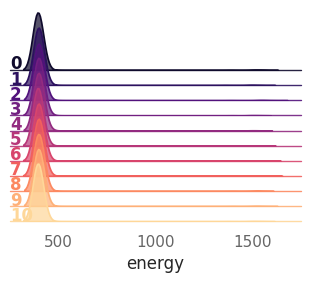

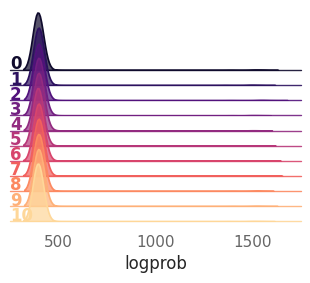

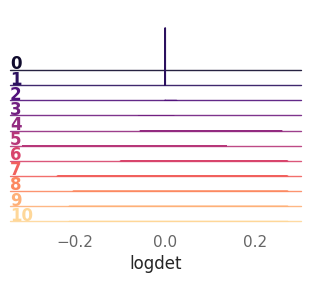

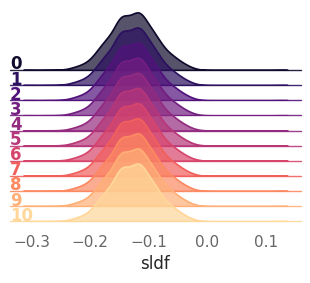

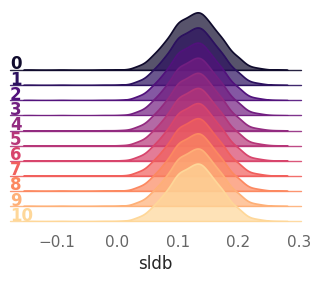

...

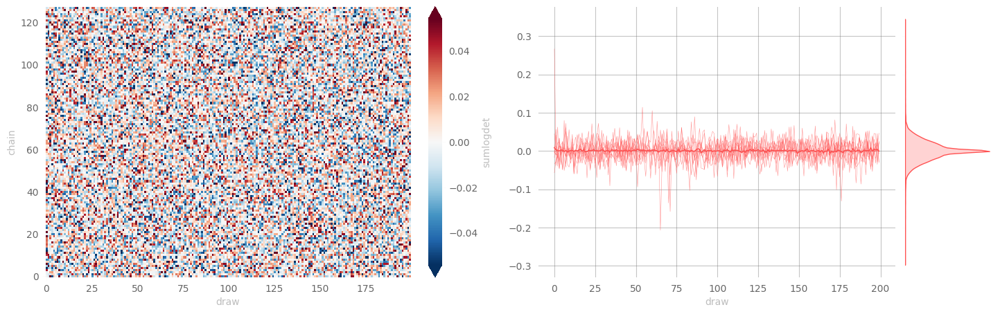

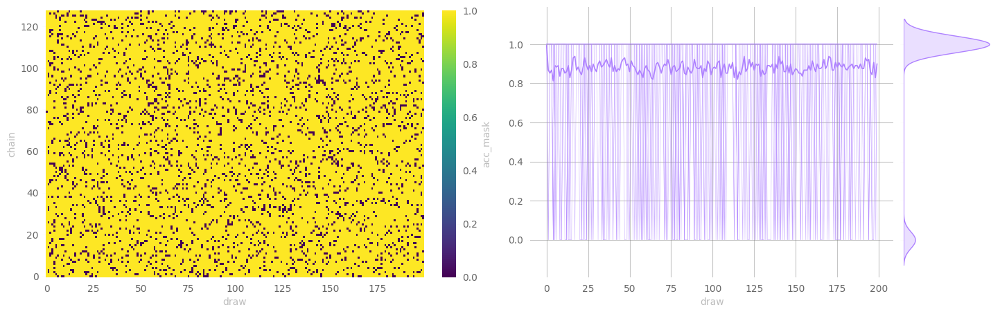

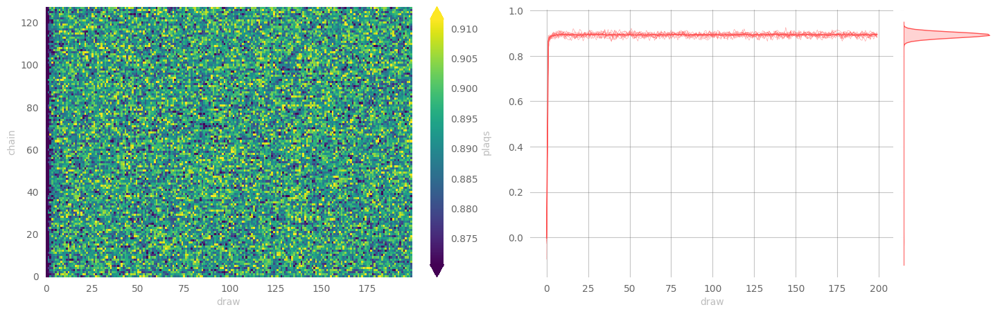

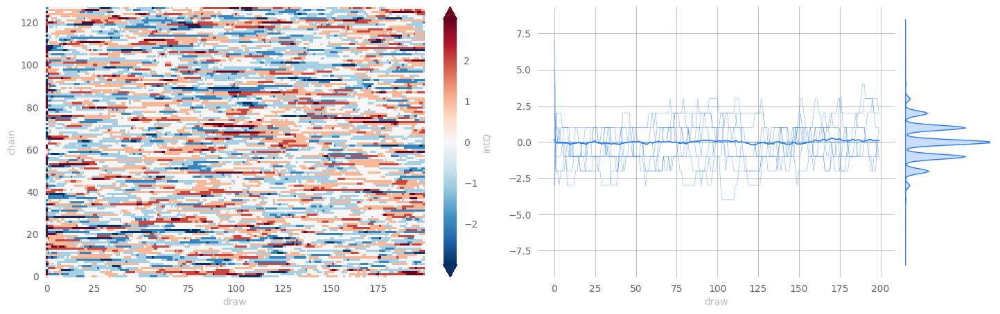

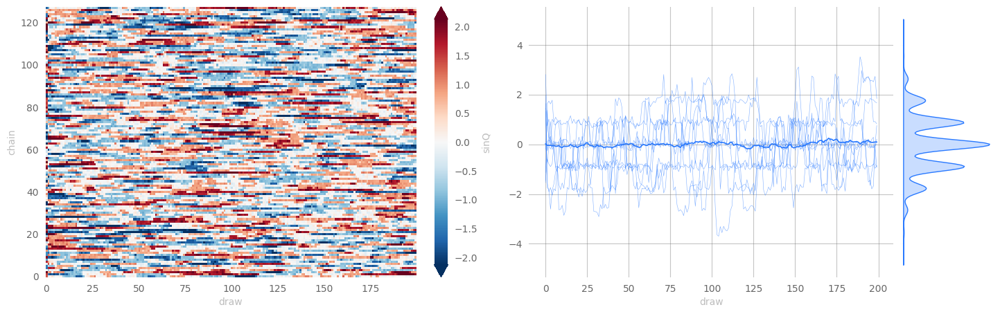

In [15]:
from l2hmc.common import plot_dataset

plot_dataset(ptExpU1.trainer.histories['eval'].get_dataset())

In [19]:
outputs['pytorch']['hmc'] = ptExpU1.evaluate(job_type='hmc', nchains=128, therm_frac=0.25)

[autoreload of l2hmc.configs failed: Traceback (most recent call last):
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 480, in superreload
    update_generic(old_obj, new_obj)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 377, in update_generic
    update(a, b)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 345, in update_class
    update_instances(old, new)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 303, in update_instances
    object.__setattr__(ref, "__class__", new)
TypeError: __class__ assignment: 'NetWeight' object layout differs from 'N

[10/24/22 14:39:45] WARNING  Using step size eps: 0.2000 for generic HMC

                    WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])

                    WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])

                    INFO     eps=0.2                                                                                    
                             beta=5.0                                                                                   
                             nlog=10                                                                                    
                             table=<rich.table.Table object at 0x7fa203642be0>                                          
                             nprint=40                                                                                  
                             eval_steps=2000                                                                            
                             nleapfrog=10

  2%|▏         | 34/2000 [00:00<00:35, 55.95it/s]

[10/24/22 14:39:46] INFO     hstep=40  dt=0.0152 beta=5.0000 loss=27.1026 dQsin=0.0415 dQint=0.0078 energy=407.6355     
                             logprob=407.6355 logdet=0.0000 acc=0.2120 sumlogdet=0.0000 acc_mask=0.2109 plaqs=0.8815    
                             intQ=0.0469 sinQ=0.0349

  4%|▍         | 75/2000 [00:01<00:32, 59.00it/s]

[10/24/22 14:39:47] INFO     hstep=80  dt=0.0152 beta=5.0000 loss=31.8948 dQsin=0.0411 dQint=0.0078 energy=402.4925     
                             logprob=402.4925 logdet=0.0000 acc=0.1819 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8885    
                             intQ=0.1406 sinQ=0.1266

  6%|▌         | 115/2000 [00:02<00:31, 59.38it/s]

                    INFO     hstep=120 dt=0.0155 beta=5.0000 loss=34.4637 dQsin=0.0365 dQint=0.0156 energy=405.0912     
                             logprob=405.0912 logdet=0.0000 acc=0.1560 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8886    
                             intQ=0.1172 sinQ=0.0740

  8%|▊         | 155/2000 [00:02<00:31, 59.22it/s]

[10/24/22 14:39:48] INFO     hstep=160 dt=0.0151 beta=5.0000 loss=35.0495 dQsin=0.0251 dQint=0.0078 energy=398.2876     
                             logprob=398.2876 logdet=0.0000 acc=0.1555 sumlogdet=0.0000 acc_mask=0.1484 plaqs=0.8918    
                             intQ=0.0937 sinQ=0.0850

 10%|▉         | 195/2000 [00:03<00:30, 59.62it/s]

[10/24/22 14:39:49] INFO     hstep=200 dt=0.0151 beta=5.0000 loss=35.7230 dQsin=0.0386 dQint=0.0000 energy=399.6004     
                             logprob=399.6004 logdet=0.0000 acc=0.2177 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8908    
                             intQ=0.1328 sinQ=0.1042

 12%|█▏        | 235/2000 [00:04<00:29, 59.53it/s]

                    INFO     hstep=240 dt=0.0151 beta=5.0000 loss=27.8132 dQsin=0.0421 dQint=0.0156 energy=399.7287     
                             logprob=399.7287 logdet=0.0000 acc=0.2115 sumlogdet=0.0000 acc_mask=0.1953 plaqs=0.8916    
                             intQ=0.0938 sinQ=0.0800

 14%|█▍        | 275/2000 [00:04<00:29, 59.22it/s]

[10/24/22 14:39:50] INFO     hstep=280 dt=0.0152 beta=5.0000 loss=43.6640 dQsin=0.0197 dQint=0.0000 energy=395.4953     
                             logprob=395.4953 logdet=0.0000 acc=0.1756 sumlogdet=0.0000 acc_mask=0.1641 plaqs=0.8934    
                             intQ=0.0391 sinQ=0.0374

 16%|█▌        | 315/2000 [00:05<00:28, 59.32it/s]

[10/24/22 14:39:51] INFO     hstep=320 dt=0.0150 beta=5.0000 loss=35.8088 dQsin=0.0296 dQint=0.0078 energy=396.8753     
                             logprob=396.8753 logdet=0.0000 acc=0.1752 sumlogdet=0.0000 acc_mask=0.1953 plaqs=0.8932    
                             intQ=0.0391 sinQ=0.0464

 18%|█▊        | 355/2000 [00:06<00:27, 59.65it/s]

                    INFO     hstep=360 dt=0.0151 beta=5.0000 loss=42.1838 dQsin=0.0227 dQint=0.0000 energy=397.6880     
                             logprob=397.6880 logdet=0.0000 acc=0.1495 sumlogdet=0.0000 acc_mask=0.1484 plaqs=0.8937    
                             intQ=0.0625 sinQ=0.0665

 20%|█▉        | 395/2000 [00:06<00:26, 59.56it/s]

[10/24/22 14:39:52] INFO     hstep=400 dt=0.0153 beta=5.0000 loss=42.7766 dQsin=0.0283 dQint=0.0000 energy=395.8298     
                             logprob=395.8298 logdet=0.0000 acc=0.1373 sumlogdet=0.0000 acc_mask=0.1484 plaqs=0.8939    
                             intQ=0.0703 sinQ=0.0516

 22%|██▏       | 435/2000 [00:07<00:27, 56.03it/s]

[10/24/22 14:39:53] INFO     hstep=440 dt=0.0185 beta=5.0000 loss=40.9494 dQsin=0.0442 dQint=0.0078 energy=395.6617     
                             logprob=395.6617 logdet=0.0000 acc=0.1808 sumlogdet=0.0000 acc_mask=0.1953 plaqs=0.8927    
                             intQ=0.0937 sinQ=0.0669

 24%|██▍       | 477/2000 [00:08<00:27, 54.62it/s]

                    INFO     hstep=480 dt=0.0166 beta=5.0000 loss=37.7484 dQsin=0.0277 dQint=0.0000 energy=397.6831     
                             logprob=397.6831 logdet=0.0000 acc=0.1462 sumlogdet=0.0000 acc_mask=0.1641 plaqs=0.8930    
                             intQ=0.1172 sinQ=0.1051

 26%|██▌       | 519/2000 [00:09<00:27, 54.75it/s]

[10/24/22 14:39:54] INFO     hstep=520 dt=0.0164 beta=5.0000 loss=32.4264 dQsin=0.0178 dQint=0.0000 energy=396.9009     
                             logprob=396.9009 logdet=0.0000 acc=0.1772 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8928    
                             intQ=0.1172 sinQ=0.1069

 28%|██▊       | 556/2000 [00:09<00:26, 54.24it/s]

[10/24/22 14:39:55] INFO     hstep=560 dt=0.0166 beta=5.0000 loss=37.4102 dQsin=0.0224 dQint=0.0000 energy=394.9178     
                             logprob=394.9178 logdet=0.0000 acc=0.1636 sumlogdet=0.0000 acc_mask=0.1797 plaqs=0.8941    
                             intQ=0.2031 sinQ=0.1890

 30%|██▉       | 594/2000 [00:10<00:25, 54.71it/s]

[10/24/22 14:39:56] INFO     hstep=600 dt=0.0164 beta=5.0000 loss=36.3267 dQsin=0.0272 dQint=0.0000 energy=399.3897     
                             logprob=399.3897 logdet=0.0000 acc=0.1729 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8921    
                             intQ=0.1172 sinQ=0.0963

 32%|███▏      | 639/2000 [00:11<00:24, 55.30it/s]

                    INFO     hstep=640 dt=0.0165 beta=5.0000 loss=33.1147 dQsin=0.0432 dQint=0.0078 energy=399.0585     
                             logprob=399.0585 logdet=0.0000 acc=0.2019 sumlogdet=0.0000 acc_mask=0.1953 plaqs=0.8917    
                             intQ=0.0625 sinQ=0.0699

 34%|███▍      | 677/2000 [00:11<00:23, 55.65it/s]

[10/24/22 14:39:57] INFO     hstep=680 dt=0.0164 beta=5.0000 loss=28.8982 dQsin=0.0430 dQint=0.0000 energy=397.1292     
                             logprob=397.1292 logdet=0.0000 acc=0.2081 sumlogdet=0.0000 acc_mask=0.2422 plaqs=0.8925    
                             intQ=0.0781 sinQ=0.0626

 36%|███▌      | 715/2000 [00:12<00:23, 54.97it/s]

[10/24/22 14:39:58] INFO     hstep=720 dt=0.0165 beta=5.0000 loss=37.1375 dQsin=0.0325 dQint=0.0078 energy=398.2181     
                             logprob=398.2181 logdet=0.0000 acc=0.1457 sumlogdet=0.0000 acc_mask=0.1797 plaqs=0.8930    
                             intQ=0.0625 sinQ=0.0605

 38%|███▊      | 754/2000 [00:13<00:22, 54.85it/s]

[10/24/22 14:39:59] INFO     hstep=760 dt=0.0165 beta=5.0000 loss=34.4522 dQsin=0.0292 dQint=0.0000 energy=397.7737     
                             logprob=397.7737 logdet=0.0000 acc=0.1677 sumlogdet=0.0000 acc_mask=0.1797 plaqs=0.8923    
                             intQ=0.0703 sinQ=0.0650

 40%|████      | 800/2000 [00:14<00:21, 56.03it/s]

                    INFO     hstep=800 dt=0.0168 beta=5.0000 loss=33.1926 dQsin=0.0436 dQint=0.0234 energy=394.6061     
                             logprob=394.6061 logdet=0.0000 acc=0.2228 sumlogdet=0.0000 acc_mask=0.2578 plaqs=0.8934    
                             intQ=0.0312 sinQ=0.0338

 42%|████▏     | 838/2000 [00:14<00:20, 55.83it/s]

[10/24/22 14:40:00] INFO     hstep=840 dt=0.0164 beta=5.0000 loss=35.0037 dQsin=0.0401 dQint=0.0156 energy=396.2031     
                             logprob=396.2031 logdet=0.0000 acc=0.1466 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8942    
                             intQ=0.0156 sinQ=-0.0136

 44%|████▍     | 878/2000 [00:15<00:20, 56.09it/s]

[10/24/22 14:40:01] INFO     hstep=880 dt=0.0165 beta=5.0000 loss=35.3360 dQsin=0.0424 dQint=0.0078 energy=395.3582     
                             logprob=395.3582 logdet=0.0000 acc=0.2011 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8937    
                             intQ=0.0078 sinQ=0.0166

 46%|████▌     | 918/2000 [00:16<00:19, 56.09it/s]

                    INFO     hstep=920 dt=0.0164 beta=5.0000 loss=35.3143 dQsin=0.0215 dQint=0.0000 energy=395.2534     
                             logprob=395.2534 logdet=0.0000 acc=0.1844 sumlogdet=0.0000 acc_mask=0.1719 plaqs=0.8941    
                             intQ=0.0078 sinQ=0.0060

 48%|████▊     | 958/2000 [00:17<00:18, 56.15it/s]

[10/24/22 14:40:02] INFO     hstep=960 dt=0.0166 beta=5.0000 loss=41.5200 dQsin=0.0179 dQint=0.0000 energy=395.6452     
                             logprob=395.6452 logdet=0.0000 acc=0.1674 sumlogdet=0.0000 acc_mask=0.1328 plaqs=0.8945    
                             intQ=-0.0156 sinQ=-0.0179

 50%|████▉     | 998/2000 [00:17<00:17, 56.24it/s]

[10/24/22 14:40:03] INFO     hstep=1000 dt=0.0164 beta=5.0000 loss=33.5660 dQsin=0.0277 dQint=0.0000 energy=395.0882    
                             logprob=395.0882 logdet=0.0000 acc=0.2180 sumlogdet=0.0000 acc_mask=0.1953 plaqs=0.8932    
                             intQ=-0.1016 sinQ=-0.0831

 52%|█████▏    | 1035/2000 [00:18<00:17, 54.76it/s]

[10/24/22 14:40:04] INFO     hstep=1040 dt=0.0164 beta=5.0000 loss=39.6032 dQsin=0.0199 dQint=0.0000 energy=396.6643    
                             logprob=396.6643 logdet=0.0000 acc=0.1734 sumlogdet=0.0000 acc_mask=0.1484 plaqs=0.8928    
                             intQ=-0.1016 sinQ=-0.0906

 54%|█████▍    | 1080/2000 [00:19<00:16, 56.37it/s]

                    INFO     hstep=1080 dt=0.0166 beta=5.0000 loss=42.6655 dQsin=0.0252 dQint=0.0078 energy=396.1728    
                             logprob=396.1728 logdet=0.0000 acc=0.1388 sumlogdet=0.0000 acc_mask=0.1641 plaqs=0.8933    
                             intQ=-0.0391 sinQ=-0.0420

 56%|█████▌    | 1118/2000 [00:19<00:15, 55.81it/s]

[10/24/22 14:40:05] INFO     hstep=1120 dt=0.0164 beta=5.0000 loss=32.6597 dQsin=0.0324 dQint=0.0156 energy=399.6196    
                             logprob=399.6196 logdet=0.0000 acc=0.1617 sumlogdet=0.0000 acc_mask=0.1641 plaqs=0.8933    
                             intQ=0.0078 sinQ=0.0027

 58%|█████▊    | 1157/2000 [00:20<00:15, 54.52it/s]

[10/24/22 14:40:06] INFO     hstep=1160 dt=0.0165 beta=5.0000 loss=36.7432 dQsin=0.0471 dQint=0.0234 energy=395.2451    
                             logprob=395.2451 logdet=0.0000 acc=0.2159 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8930    
                             intQ=-0.0547 sinQ=-0.0484

 60%|█████▉    | 1195/2000 [00:21<00:14, 54.75it/s]

[10/24/22 14:40:07] INFO     hstep=1200 dt=0.0165 beta=5.0000 loss=34.5641 dQsin=0.0374 dQint=0.0000 energy=395.7036    
                             logprob=395.7036 logdet=0.0000 acc=0.2028 sumlogdet=0.0000 acc_mask=0.1797 plaqs=0.8934    
                             intQ=-0.0469 sinQ=-0.0331

 62%|██████▏   | 1240/2000 [00:22<00:13, 56.02it/s]

                    INFO     hstep=1240 dt=0.0166 beta=5.0000 loss=40.2429 dQsin=0.0226 dQint=0.0000 energy=396.9021    
                             logprob=396.9021 logdet=0.0000 acc=0.1320 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8932    
                             intQ=-0.0703 sinQ=-0.0718

 64%|██████▍   | 1278/2000 [00:22<00:12, 55.73it/s]

[10/24/22 14:40:08] INFO     hstep=1280 dt=0.0165 beta=5.0000 loss=30.6032 dQsin=0.0482 dQint=0.0078 energy=394.7753    
                             logprob=394.7753 logdet=0.0000 acc=0.2395 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8934    
                             intQ=-0.1172 sinQ=-0.1049

 66%|██████▌   | 1319/2000 [00:23<00:15, 43.92it/s]

[10/24/22 14:40:09] INFO     hstep=1320 dt=0.0165 beta=5.0000 loss=36.5835 dQsin=0.0285 dQint=0.0078 energy=396.8719    
                             logprob=396.8719 logdet=0.0000 acc=0.1371 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8937    
                             intQ=-0.1562 sinQ=-0.1228

 68%|██████▊   | 1356/2000 [00:24<00:12, 53.10it/s]

[10/24/22 14:40:10] INFO     hstep=1360 dt=0.0165 beta=5.0000 loss=34.1623 dQsin=0.0411 dQint=0.0000 energy=396.9689    
                             logprob=396.9689 logdet=0.0000 acc=0.2342 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8922    
                             intQ=-0.1953 sinQ=-0.1693

 70%|███████   | 1400/2000 [00:25<00:10, 55.80it/s]

                    INFO     hstep=1400 dt=0.0165 beta=5.0000 loss=37.7951 dQsin=0.0379 dQint=0.0078 energy=396.1547    
                             logprob=396.1547 logdet=0.0000 acc=0.2137 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8936    
                             intQ=-0.1563 sinQ=-0.1416

 72%|███████▏  | 1438/2000 [00:25<00:10, 55.37it/s]

[10/24/22 14:40:11] INFO     hstep=1440 dt=0.0165 beta=5.0000 loss=30.1157 dQsin=0.0482 dQint=0.0078 energy=395.6467    
                             logprob=395.6467 logdet=0.0000 acc=0.2021 sumlogdet=0.0000 acc_mask=0.2109 plaqs=0.8934    
                             intQ=-0.1172 sinQ=-0.0862

 74%|███████▎  | 1474/2000 [00:26<00:09, 53.66it/s]

[10/24/22 14:40:12] INFO     hstep=1480 dt=0.0165 beta=5.0000 loss=33.6391 dQsin=0.0327 dQint=0.0078 energy=397.3299    
                             logprob=397.3299 logdet=0.0000 acc=0.1843 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8925    
                             intQ=-0.1328 sinQ=-0.0962

 76%|███████▌  | 1518/2000 [00:27<00:08, 55.24it/s]

[10/24/22 14:40:13] INFO     hstep=1520 dt=0.0165 beta=5.0000 loss=36.3325 dQsin=0.0336 dQint=0.0078 energy=397.1499    
                             logprob=397.1499 logdet=0.0000 acc=0.1325 sumlogdet=0.0000 acc_mask=0.1328 plaqs=0.8934    
                             intQ=-0.0312 sinQ=-0.0490

 78%|███████▊  | 1554/2000 [00:28<00:08, 54.12it/s]

                    INFO     hstep=1560 dt=0.0165 beta=5.0000 loss=26.4212 dQsin=0.0645 dQint=0.0234 energy=394.1973    
                             logprob=394.1973 logdet=0.0000 acc=0.2362 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8941    
                             intQ=-0.0078 sinQ=-0.0092

 80%|████████  | 1600/2000 [00:28<00:07, 55.74it/s]

[10/24/22 14:40:14] INFO     hstep=1600 dt=0.0166 beta=5.0000 loss=37.2923 dQsin=0.0491 dQint=0.0156 energy=397.8067    
                             logprob=397.8067 logdet=0.0000 acc=0.1865 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8927    
                             intQ=-0.0000 sinQ=-0.0020

 82%|████████▏ | 1638/2000 [00:29<00:06, 55.94it/s]

[10/24/22 14:40:15] INFO     hstep=1640 dt=0.0165 beta=5.0000 loss=31.9838 dQsin=0.0344 dQint=0.0078 energy=397.5549    
                             logprob=397.5549 logdet=0.0000 acc=0.1784 sumlogdet=0.0000 acc_mask=0.2188 plaqs=0.8931    
                             intQ=-0.0625 sinQ=-0.0528

 84%|████████▍ | 1678/2000 [00:30<00:05, 56.04it/s]

[10/24/22 14:40:16] INFO     hstep=1680 dt=0.0165 beta=5.0000 loss=34.6759 dQsin=0.0224 dQint=0.0078 energy=395.0386    
                             logprob=395.0386 logdet=0.0000 acc=0.1644 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8936    
                             intQ=0.0078 sinQ=0.0077

 86%|████████▌ | 1718/2000 [00:31<00:05, 56.00it/s]

                    INFO     hstep=1720 dt=0.0165 beta=5.0000 loss=29.4763 dQsin=0.0373 dQint=0.0000 energy=397.1080    
                             logprob=397.1080 logdet=0.0000 acc=0.1895 sumlogdet=0.0000 acc_mask=0.1641 plaqs=0.8930    
                             intQ=0.0313 sinQ=0.0240

 88%|████████▊ | 1758/2000 [00:31<00:04, 56.03it/s]

[10/24/22 14:40:17] INFO     hstep=1760 dt=0.0165 beta=5.0000 loss=37.5411 dQsin=0.0272 dQint=0.0078 energy=400.4733    
                             logprob=400.4733 logdet=0.0000 acc=0.1737 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8912    
                             intQ=0.0937 sinQ=0.1006

 90%|████████▉ | 1798/2000 [00:32<00:03, 56.06it/s]

[10/24/22 14:40:18] INFO     hstep=1800 dt=0.0165 beta=5.0000 loss=28.4414 dQsin=0.0291 dQint=0.0000 energy=394.1345    
                             logprob=394.1345 logdet=0.0000 acc=0.1861 sumlogdet=0.0000 acc_mask=0.1953 plaqs=0.8928    
                             intQ=0.1484 sinQ=0.1337

 92%|█████████▏| 1836/2000 [00:33<00:02, 55.03it/s]

                    INFO     hstep=1840 dt=0.0165 beta=5.0000 loss=33.4614 dQsin=0.0455 dQint=0.0234 energy=396.6966    
                             logprob=396.6966 logdet=0.0000 acc=0.1848 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8927    
                             intQ=0.0859 sinQ=0.0764

 94%|█████████▍| 1880/2000 [00:34<00:02, 56.18it/s]

[10/24/22 14:40:19] INFO     hstep=1880 dt=0.0166 beta=5.0000 loss=36.7122 dQsin=0.0216 dQint=0.0000 energy=391.9349    
                             logprob=391.9349 logdet=0.0000 acc=0.1552 sumlogdet=0.0000 acc_mask=0.1719 plaqs=0.8953    
                             intQ=0.0469 sinQ=0.0461

 96%|█████████▌| 1916/2000 [00:34<00:01, 53.66it/s]

[10/24/22 14:40:20] INFO     hstep=1920 dt=0.0165 beta=5.0000 loss=38.1711 dQsin=0.0279 dQint=0.0078 energy=396.7564    
                             logprob=396.7564 logdet=0.0000 acc=0.1527 sumlogdet=0.0000 acc_mask=0.1484 plaqs=0.8937    
                             intQ=-0.0078 sinQ=-0.0122

 98%|█████████▊| 1954/2000 [00:35<00:00, 54.12it/s]

[10/24/22 14:40:21] INFO     hstep=1960 dt=0.0164 beta=5.0000 loss=42.2447 dQsin=0.0210 dQint=0.0000 energy=395.9700    
                             logprob=395.9700 logdet=0.0000 acc=0.1134 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8942    
                             intQ=0.0469 sinQ=0.0629

100%|██████████| 2000/2000 [00:36<00:00, 55.16it/s]


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3378, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_1565301/2217710791.py", line 1, in <module>
    outputs['pytorch']['hmc'] = ptExpU1.evaluate(job_type='hmc', nchains=128, therm_frac=0.25)
  File "/lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/experiment/pytorch/experiment.py", line 405, in evaluate
    output['dataset'] = self.save_dataset(
  File "/lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/experiment/experiment.py", line 303, in save_dataset
    assert isinstance(
AssertionError

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 1997, in showtraceback


[autoreload of l2hmc.configs failed: Traceback (most recent call last):
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 480, in superreload
    update_generic(old_obj, new_obj)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 377, in update_generic
    update(a, b)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 345, in update_class
    update_instances(old, new)
  File "/home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 303, in update_instances
    object.__setattr__(ref, "__class__", new)
TypeError: __class__ assignment: 'NetWeight' object layout differs from 'N

[10/24/22 14:03:50] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/energy_ridgeplot.svg

[10/24/22 14:03:51] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/logprob_ridgeplot.svg

[10/24/22 14:03:53] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/
                             src/l2hmc/notebooks/ridgeplots/logdet_ridgeplot.svg

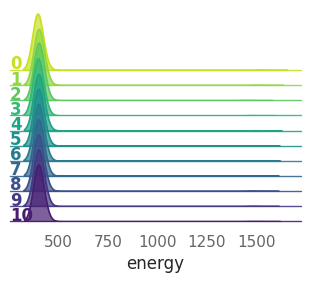

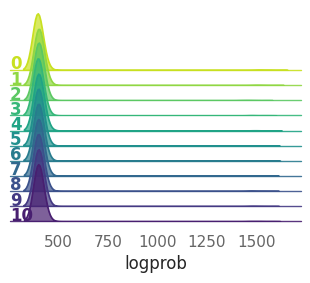

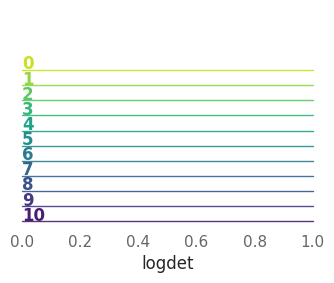

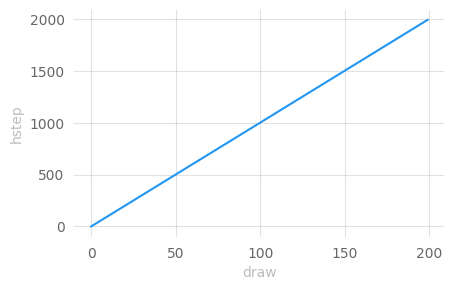

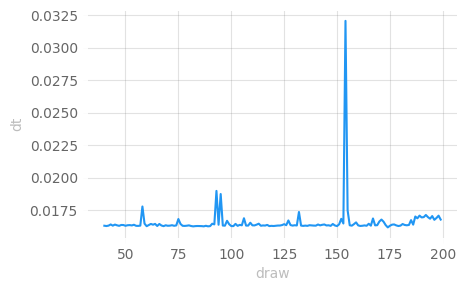

...

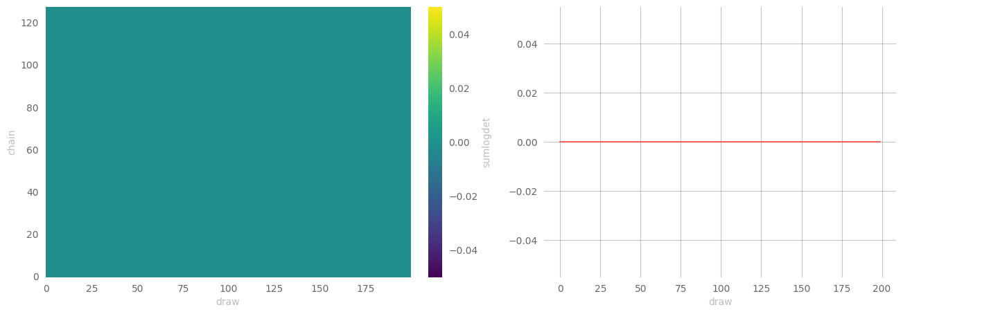

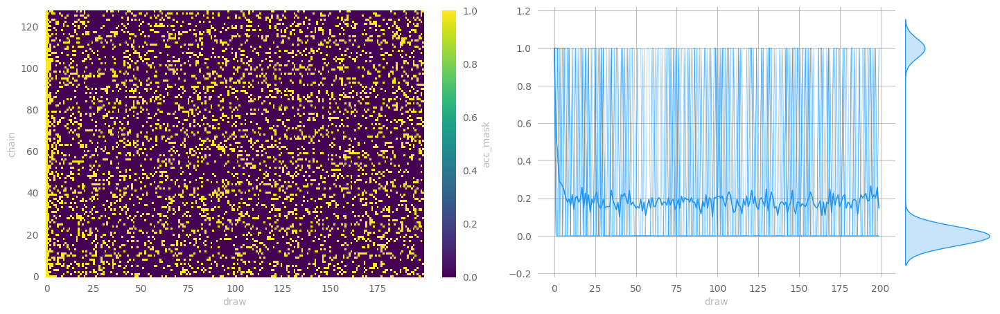

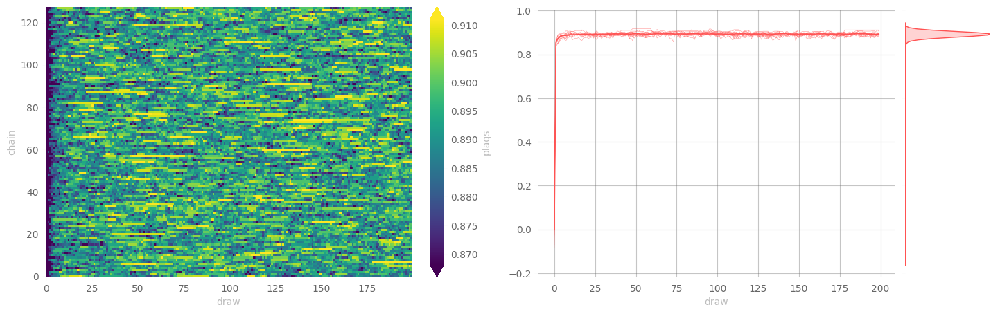

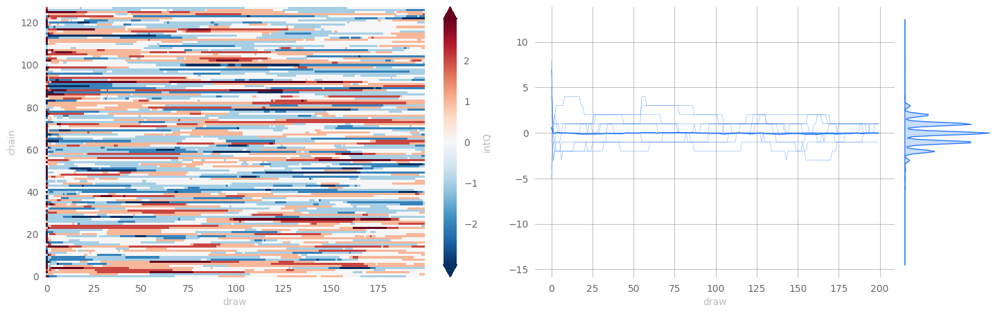

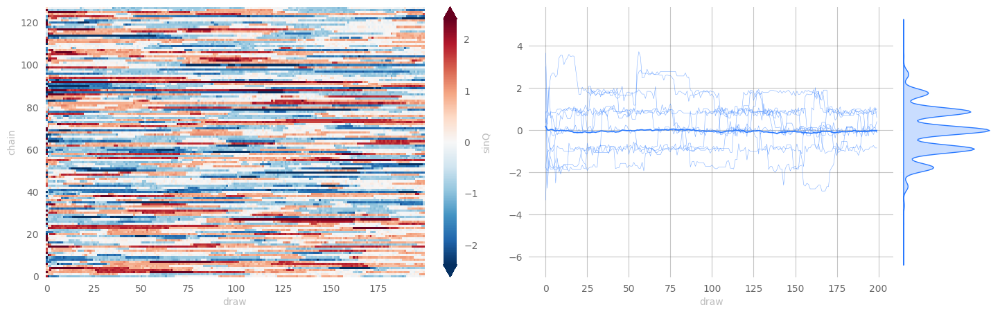

In [17]:
from l2hmc.common import plot_dataset
plot_dataset(ptExpU1.trainer.histories['hmc'].get_dataset())

## Model Performance

Our goal is improving the efficiency of our MCMC sampler.

In particular, we are interested in generating **independent** configurations which we can then use to calculate expectation values of physical observables.

For our purposes, we are interested in obtaining lattice configurations from distinct _topological charge sectors_, as characterized by a configurations _topological charge_, $Q$.

Explicitly, HMC is known to suffer from _critical slowing down_, a phenomenon in which our configurations remains stuck in some local topological charge sector and fails to produce distinct configurations.

Because of this, we can assess our models' performance by looking at the _tunneling rate_, i.e. the rate at which our sampler jumps between these different charge sectors.

We can write this quantity as:

$$\delta Q = |Q^{(i)} - Q^{(i-1)}|$$

i.e. look at the difference in the topological charge between sequential configurations.

<div class="alert alert-block alert-info">
<b>Note:</b> 
The efficiency of our sampler is directly proportional to the tunneling rate.
    
Explicitly, this means that the **more efficient** the model $\longrightarrow$
    
- the **larger** tunneling rate
- the **smaller** integrated autocorrelation time for $Q$
</div>

In [81]:
import xarray as xr

def get_thermalized_configs(x: np.ndarray | xr.DataArray) -> np.ndarray | xr.DataArray:
    if isinstance(x, np.ndarray):
        argmax = max(list(set(sorted(np.argmax(x, -1)))))
        return x[..., argmax+1:]
    if isinstance(x, xr.DataArray):
        argmax = max(list(set(sorted(x.argmax('draw').data))))
        return x[..., argmax+1:]
    raise TypeError

In [61]:
np.set_printoptions(precision=4, suppress=True, )

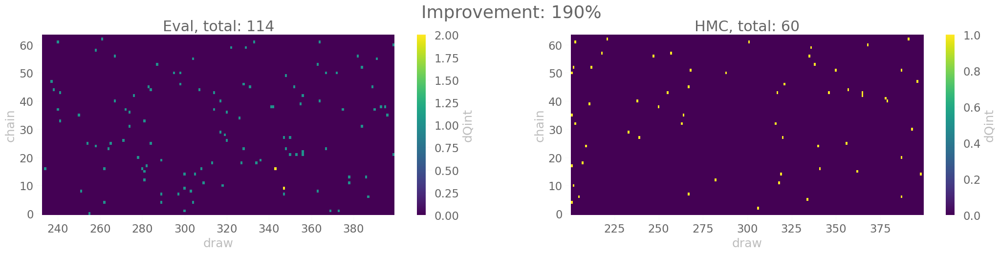

In [88]:
import matplotlib.pyplot as plt
sns.set_context('talk')

dsets = {
    'pt': {
        'train': ptExpU1.trainer.histories['train'].get_dataset(),
        'eval': ptExpU1.trainer.histories['eval'].get_dataset(),
        'hmc': ptExpU1.trainer.histories['hmc'].get_dataset()
    },
    'tf': {
        'train': None,
        'eval': None,
        'hmc': None,
    }
}

ndraws = len(dsets['pt']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.7 * ndraws)

dqe = get_thermalized_configs(dsets['pt']['eval']['dQint'])
dqh = get_thermalized_configs(dsets['pt']['hmc']['dQint'])

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='large');
_ = fig.suptitle(fr'PyTorch Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large', y=1.01)

##  TensorFlow:

[10/22/22 13:45:43] INFO     Restored checkpoint from: /lus/grand/projects/DLHMC/foremans/loc
                             ations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2
                             022-10-22-083745/tensorflow/train/checkpoints/ckpt-2

─────────────────────────────────────────────── ERA: 0 / 10, BETA: 2.000 ───────────────────────────────────────────────

[10/22/22 13:46:01] INFO     era=0   epoch=0   train_step=10000.0000 dt=16.6979 beta=2.0000  
                             loss=-946.0391 dQsin=2.3911 dQint=5.1489 energy=766.3679        
                             logprob=766.3679 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1598 veps=0.1551 acc=0.9648 sumlogdet=0.0000  
                             acc_mask=0.9648 plaqs=0.0011 intQ=0.0977 sinQ=-0.0019           
                             tstep=10000.0000 lr=0.0010

[10/22/22 13:46:35] INFO     era=0   epoch=250 train_step=10250.0000 dt=0.0655 beta=2.0000   
                             loss=-277.6732 dQsin=1.2770 dQint=1.7910 energy=411.7286        
                             logprob=411.7286 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1817 veps=0.1802 acc=0.9066 sumlogdet=0.0000  
                             acc_mask=0.9155 plaqs=0.6970 intQ=-0.0190 sinQ=-0.0079          
                             tstep=10250.0000 lr=0.0010

[10/22/22 13:47:09] INFO     era=0   epoch=500 train_step=10500.0000 dt=0.0575 beta=2.0000   
                             loss=-282.4490 dQsin=1.2607 dQint=1.8110 energy=411.4092        
                             logprob=411.4092 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1991 veps=0.1983 acc=0.9022 sumlogdet=0.0000  
                             acc_mask=0.9004 plaqs=0.6970 intQ=-0.0522 sinQ=-0.0391          
                             tstep=10500.0000 lr=0.0010

[10/22/22 13:47:42] INFO     era=0   epoch=750 train_step=10750.0000 dt=0.0551 beta=2.0000   
                             loss=-293.9883 dQsin=1.2839 dQint=1.8164 energy=411.0417        
                             logprob=411.0417 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2117 veps=0.2115 acc=0.8780 sumlogdet=0.0000  
                             acc_mask=0.8784 plaqs=0.6978 intQ=-0.0020 sinQ=-0.0049          
                             tstep=10750.0000 lr=0.0010

[10/22/22 13:48:16] INFO     Saving took: 0.0234661s

                    INFO     Era 0 took: 153.656s

─────────────────────────────────────────────── ERA: 1 / 10, BETA: 2.333 ───────────────────────────────────────────────

[10/22/22 13:48:18] INFO     era=1   epoch=0   train_step=11000.0000 dt=0.0573 beta=2.3333   
                             loss=-250.7892 dQsin=1.1897 dQint=1.6621 energy=436.8501        
                             logprob=436.8501 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2215 veps=0.2214 acc=0.8674 sumlogdet=0.0000  
                             acc_mask=0.8721 plaqs=0.6980 intQ=-0.0259 sinQ=0.0005           
                             tstep=11000.0000 lr=0.0010

[10/22/22 13:48:52] INFO     era=1   epoch=250 train_step=11250.0000 dt=0.0554 beta=2.3333   
                             loss=-209.8087 dQsin=1.0502 dQint=1.3989 energy=408.7942        
                             logprob=408.7942 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2270 veps=0.2255 acc=0.8337 sumlogdet=0.0000  
                             acc_mask=0.8330 plaqs=0.7463 intQ=-0.0439 sinQ=-0.0342          
                             tstep=11250.0000 lr=0.0010

[10/22/22 13:49:26] INFO     era=1   epoch=500 train_step=11500.0000 dt=0.0560 beta=2.3333   
                             loss=-220.4785 dQsin=1.0465 dQint=1.3652 energy=408.6750        
                             logprob=408.6750 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2309 veps=0.2289 acc=0.8218 sumlogdet=0.0000  
                             acc_mask=0.8145 plaqs=0.7460 intQ=0.0181 sinQ=0.0071            
                             tstep=11500.0000 lr=0.0010

[10/22/22 13:50:00] INFO     era=1   epoch=750 train_step=11750.0000 dt=0.0547 beta=2.3333   
                             loss=-213.6876 dQsin=1.0417 dQint=1.3481 energy=408.9926        
                             logprob=408.9926 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2329 veps=0.2311 acc=0.8156 sumlogdet=0.0000  
                             acc_mask=0.8149 plaqs=0.7457 intQ=-0.0273 sinQ=-0.0012          
                             tstep=11750.0000 lr=0.0010

[10/22/22 13:50:32] INFO     Saving took: 0.00165319s

                    INFO     Era 1 took: 135.376s

                    INFO     Avgs over last era:                                             
                              train_step=6490.3846, dt=0.0685, beta=1.6667, loss=-445.6284,  
                             dQsin=1.5277, dQint=2.5046, energy=403.5991, logprob=403.5991,  
                             logdet=0.0000, sldf=0.0000, sldb=-0.0000, sld=0.0000,           
                             xeps=0.2296, veps=0.2280, acc=0.8821, sumlogdet=0.0000,         
                             acc_mask=0.8820, plaqs=0.5956, intQ=0.0018, sinQ=0.0027,        
                             tstep=6490.3846, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 2 / 10, BETA: 2.667 ───────────────────────────────────────────────

[10/22/22 13:50:33] INFO     era=2   epoch=0   train_step=12000.0000 dt=0.0583 beta=2.6667   
                             loss=-170.9885 dQsin=0.9261 dQint=1.1978 energy=431.0931        
                             logprob=431.0931 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2337 veps=0.2327 acc=0.7880 sumlogdet=0.0000  
                             acc_mask=0.7900 plaqs=0.7446 intQ=-0.0405 sinQ=-0.0077          
                             tstep=12000.0000 lr=0.0010

[10/22/22 13:51:10] INFO     era=2   epoch=250 train_step=12250.0000 dt=0.0544 beta=2.6667   
                             loss=-131.4607 dQsin=0.8069 dQint=0.9819 energy=406.6494        
                             logprob=406.6494 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2307 veps=0.2287 acc=0.7868 sumlogdet=0.0000  
                             acc_mask=0.7905 plaqs=0.7818 intQ=-0.0171 sinQ=-0.0241          
                             tstep=12250.0000 lr=0.0010

[10/22/22 13:51:44] INFO     era=2   epoch=500 train_step=12500.0000 dt=0.0549 beta=2.6667   
                             loss=-122.4717 dQsin=0.7924 dQint=0.9771 energy=406.5816        
                             logprob=406.5816 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2292 veps=0.2263 acc=0.7853 sumlogdet=0.0000  
                             acc_mask=0.7866 plaqs=0.7820 intQ=0.0317 sinQ=0.0204            
                             tstep=12500.0000 lr=0.0010

[10/22/22 13:52:18] INFO     era=2   epoch=750 train_step=12750.0000 dt=0.0551 beta=2.6667   
                             loss=-130.4012 dQsin=0.8033 dQint=0.9526 energy=406.1067        
                             logprob=406.1067 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2293 veps=0.2253 acc=0.7754 sumlogdet=0.0000  
                             acc_mask=0.7798 plaqs=0.7819 intQ=0.0444 sinQ=0.0410            
                             tstep=12750.0000 lr=0.0010

[10/22/22 13:52:50] INFO     Saving took: 0.00173998s

                    INFO     Era 2 took: 138.303s

                    INFO     Avgs over last era:                                             
                              train_step=7490.3846, dt=0.0636, beta=1.8333, loss=-411.5548,  
                             dQsin=1.4174, dQint=2.3255, energy=402.3348, logprob=402.3348,  
                             logdet=0.0000, sldf=0.0000, sldb=0.0000, sld=0.0000,            
                             xeps=0.2332, veps=0.2301, acc=0.8592, sumlogdet=0.0000,         
                             acc_mask=0.8596, plaqs=0.6137, intQ=-0.0038, sinQ=-0.0048,      
                             tstep=7490.3846, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 3 / 10, BETA: 3.000 ───────────────────────────────────────────────

[10/22/22 13:52:52] INFO     era=3   epoch=0   train_step=13000.0000 dt=0.0593 beta=3.0000   
                             loss=-110.6773 dQsin=0.7503 dQint=0.8960 energy=424.9463        
                             logprob=424.9463 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2293 veps=0.2256 acc=0.7650 sumlogdet=0.0000  
                             acc_mask=0.7690 plaqs=0.7817 intQ=0.0142 sinQ=0.0249            
                             tstep=13000.0000 lr=0.0010

[10/22/22 13:53:25] INFO     era=3   epoch=250 train_step=13250.0000 dt=0.0553 beta=3.0000   
                             loss=-77.4981 dQsin=0.5916 dQint=0.6655 energy=403.8474         
                             logprob=403.8474 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2272 veps=0.2201 acc=0.7369 sumlogdet=0.0000  
                             acc_mask=0.7305 plaqs=0.8098 intQ=-0.0283 sinQ=-0.0253          
                             tstep=13250.0000 lr=0.0010

[10/22/22 13:54:02] INFO     era=3   epoch=500 train_step=13500.0000 dt=0.0556 beta=3.0000   
                             loss=-75.4949 dQsin=0.5837 dQint=0.6626 energy=403.1873         
                             logprob=403.1873 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2257 veps=0.2188 acc=0.7403 sumlogdet=0.0000  
                             acc_mask=0.7383 plaqs=0.8102 intQ=-0.0132 sinQ=-0.0151          
                             tstep=13500.0000 lr=0.0010

[10/22/22 13:54:35] INFO     era=3   epoch=750 train_step=13750.0000 dt=0.0552 beta=3.0000   
                             loss=-74.7785 dQsin=0.6021 dQint=0.6904 energy=403.2191         
                             logprob=403.2191 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2250 veps=0.2183 acc=0.7493 sumlogdet=0.0000  
                             acc_mask=0.7524 plaqs=0.8099 intQ=-0.0693 sinQ=-0.0589          
                             tstep=13750.0000 lr=0.0010

[10/22/22 13:55:07] INFO     Saving took: 0.00151992s

                    INFO     Era 3 took: 136.831s

                    INFO     Avgs over last era:                                             
                              train_step=8490.3846, dt=0.0674, beta=2.0000, loss=-386.5041,  
                             dQsin=1.3244, dQint=2.1752, energy=401.0234, logprob=401.0234,  
                             logdet=0.0000, sldf=0.0000, sldb=0.0000, sld=0.0000,            
                             xeps=0.2311, veps=0.2265, acc=0.8427, sumlogdet=0.0000,         
                             acc_mask=0.8446, plaqs=0.6279, intQ=-0.0003, sinQ=-0.0015,      
                             tstep=8490.3846, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 4 / 10, BETA: 3.333 ───────────────────────────────────────────────

[10/22/22 13:55:08] INFO     era=4   epoch=0   train_step=14000.0000 dt=0.0656 beta=3.3333   
                             loss=-65.3750 dQsin=0.5289 dQint=0.5723 energy=420.1082         
                             logprob=420.1082 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2245 veps=0.2183 acc=0.7252 sumlogdet=0.0000  
                             acc_mask=0.7236 plaqs=0.8098 intQ=-0.0732 sinQ=-0.0450          
                             tstep=14000.0000 lr=0.0010

[10/22/22 13:55:42] INFO     era=4   epoch=250 train_step=14250.0000 dt=0.0645 beta=3.3333   
                             loss=-48.9568 dQsin=0.4491 dQint=0.4521 energy=401.8295         
                             logprob=401.8295 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2233 veps=0.2113 acc=0.7049 sumlogdet=0.0000  
                             acc_mask=0.6963 plaqs=0.8320 intQ=0.0083 sinQ=0.0068            
                             tstep=14250.0000 lr=0.0010

[10/22/22 13:56:15] INFO     era=4   epoch=500 train_step=14500.0000 dt=0.0550 beta=3.3333   
                             loss=-48.2327 dQsin=0.4545 dQint=0.4512 energy=400.6548         
                             logprob=400.6548 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2200 veps=0.2100 acc=0.7146 sumlogdet=0.0000  
                             acc_mask=0.7192 plaqs=0.8322 intQ=0.0024 sinQ=0.0063            
                             tstep=14500.0000 lr=0.0010

[10/22/22 13:56:51] INFO     era=4   epoch=750 train_step=14750.0000 dt=0.0548 beta=3.3333   
                             loss=-46.0067 dQsin=0.4448 dQint=0.4507 energy=400.9078         
                             logprob=400.9078 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2199 veps=0.2097 acc=0.7054 sumlogdet=0.0000  
                             acc_mask=0.6997 plaqs=0.8320 intQ=0.1147 sinQ=0.0947            
                             tstep=14750.0000 lr=0.0010

[10/22/22 13:57:23] INFO     Saving took: 0.337091s

                    INFO     Era 4 took: 136.393s

                    INFO     Avgs over last era:                                             
                              train_step=9490.3846, dt=0.0625, beta=3.1667, loss=-64.4085,   
                             dQsin=0.5121, dQint=0.5561, energy=406.0674, logprob=406.0674,  
                             logdet=0.0000, sldf=0.0000, sldb=0.0000, sld=0.0000,            
                             xeps=0.2293, veps=0.2190, acc=0.6922, sumlogdet=0.0000,         
                             acc_mask=0.6923, plaqs=0.8170, intQ=0.0019, sinQ=0.0018,        
                             tstep=9490.3846, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 5 / 10, BETA: 3.667 ───────────────────────────────────────────────

[10/22/22 13:57:25] INFO     era=5   epoch=0   train_step=15000.0000 dt=0.0547 beta=3.6667   
                             loss=-37.1180 dQsin=0.3875 dQint=0.3599 energy=415.7430         
                             logprob=415.7430 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2216 veps=0.2078 acc=0.6779 sumlogdet=0.0000  
                             acc_mask=0.6768 plaqs=0.8326 intQ=-0.0405 sinQ=-0.0196          
                             tstep=15000.0000 lr=0.0010

[10/22/22 13:57:58] INFO     era=5   epoch=250 train_step=15250.0000 dt=0.0554 beta=3.6667   
                             loss=-27.4886 dQsin=0.3427 dQint=0.2871 energy=400.6420         
                             logprob=400.6420 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2175 veps=0.2044 acc=0.6840 sumlogdet=0.0000  
                             acc_mask=0.6885 plaqs=0.8490 intQ=-0.0151 sinQ=-0.0068          
                             tstep=15250.0000 lr=0.0010

[10/22/22 13:58:32] INFO     era=5   epoch=500 train_step=15500.0000 dt=0.0553 beta=3.6667   
                             loss=-22.2843 dQsin=0.3122 dQint=0.2695 energy=400.4858         
                             logprob=400.4858 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2175 veps=0.1977 acc=0.6392 sumlogdet=0.0000  
                             acc_mask=0.6396 plaqs=0.8493 intQ=0.0552 sinQ=0.0393            
                             tstep=15500.0000 lr=0.0010

[10/22/22 13:59:08] INFO     era=5   epoch=750 train_step=15750.0000 dt=0.0921 beta=3.6667   
                             loss=-27.7405 dQsin=0.3457 dQint=0.2847 energy=400.0373         
                             logprob=400.0373 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2132 veps=0.2017 acc=0.6793 sumlogdet=0.0000  
                             acc_mask=0.6914 plaqs=0.8489 intQ=0.0210 sinQ=0.0252            
                             tstep=15750.0000 lr=0.0010

[10/22/22 13:59:40] INFO     Saving took: 0.00152469s

                    INFO     Era 5 took: 137.026s

                    INFO     Avgs over last era:                                             
                              train_step=10490.3846, dt=0.0644, beta=3.8333, loss=-20.0707,  
                             dQsin=0.2875, dQint=0.2220, energy=400.2438, logprob=400.2438,  
                             logdet=0.0000, sldf=0.0000, sldb=-0.0000, sld=0.0000,           
                             xeps=0.2192, veps=0.2068, acc=0.6572, sumlogdet=0.0000,         
                             acc_mask=0.6560, plaqs=0.8557, intQ=-0.0018, sinQ=-0.0008,      
                             tstep=10490.3846, lr=0.0010                                     
                    

─────────────────────────────────────────────── ERA: 6 / 10, BETA: 4.000 ───────────────────────────────────────────────

[10/22/22 13:59:42] INFO     era=6   epoch=0   train_step=16000.0000 dt=0.0526 beta=4.0000   
                             loss=-20.2331 dQsin=0.3062 dQint=0.2314 energy=412.6627         
                             logprob=412.6627 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2127 veps=0.2007 acc=0.7144 sumlogdet=0.0000  
                             acc_mask=0.7095 plaqs=0.8495 intQ=0.0088 sinQ=0.0040            
                             tstep=16000.0000 lr=0.0010

[10/22/22 14:00:15] INFO     era=6   epoch=250 train_step=16250.0000 dt=0.0710 beta=4.0000   
                             loss=-13.4560 dQsin=0.2547 dQint=0.1797 energy=398.9365         
                             logprob=398.9365 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2078 veps=0.1925 acc=0.6815 sumlogdet=0.0000  
                             acc_mask=0.6875 plaqs=0.8635 intQ=-0.0352 sinQ=-0.0283          
                             tstep=16250.0000 lr=0.0010

[10/22/22 14:00:49] INFO     era=6   epoch=500 train_step=16500.0000 dt=0.0548 beta=4.0000   
                             loss=-13.6965 dQsin=0.2512 dQint=0.1616 energy=398.0421         
                             logprob=398.0421 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2041 veps=0.1935 acc=0.7235 sumlogdet=0.0000  
                             acc_mask=0.7012 plaqs=0.8631 intQ=0.0557 sinQ=0.0499            
                             tstep=16500.0000 lr=0.0010

[10/22/22 14:01:22] INFO     era=6   epoch=750 train_step=16750.0000 dt=0.0552 beta=4.0000   
                             loss=-13.2386 dQsin=0.2493 dQint=0.1665 energy=398.4810         
                             logprob=398.4810 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2057 veps=0.1911 acc=0.6868 sumlogdet=0.0000  
                             acc_mask=0.6846 plaqs=0.8634 intQ=-0.0459 sinQ=-0.0345          
                             tstep=16750.0000 lr=0.0010

[10/22/22 14:01:56] INFO     Saving took: 0.0022223s

                    INFO     Era 6 took: 135.891s

                    INFO     Avgs over last era:                                             
                              train_step=11490.3846, dt=0.0654, beta=4.5000, loss=-4.8747,   
                             dQsin=0.1887, dQint=0.0945, energy=397.1714, logprob=397.1714,  
                             logdet=0.0000, sldf=0.0000, sldb=0.0000, sld=0.0000,            
                             xeps=0.2007, veps=0.1946, acc=0.7117, sumlogdet=0.0000,         
                             acc_mask=0.7112, plaqs=0.8780, intQ=-0.0068, sinQ=-0.0060,      
                             tstep=11490.3846, lr=0.0010                                     
                    

─────────────────────────────────────────────── ERA: 7 / 10, BETA: 4.333 ───────────────────────────────────────────────

[10/22/22 14:01:58] INFO     era=7   epoch=0   train_step=17000.0000 dt=0.0558 beta=4.3333   
                             loss=-11.3576 dQsin=0.2429 dQint=0.1460 energy=409.9554         
                             logprob=409.9554 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.2036 veps=0.1902 acc=0.7141 sumlogdet=0.0000  
                             acc_mask=0.7231 plaqs=0.8637 intQ=-0.0059 sinQ=-0.0065          
                             tstep=17000.0000 lr=0.0010

[10/22/22 14:02:33] INFO     era=7   epoch=250 train_step=17250.0000 dt=0.0552 beta=4.3333   
                             loss=-5.1351 dQsin=0.2009 dQint=0.0923 energy=396.6232          
                             logprob=396.6232 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1954 veps=0.1887 acc=0.7492 sumlogdet=0.0000  
                             acc_mask=0.7456 plaqs=0.8754 intQ=-0.0054 sinQ=-0.0091          
                             tstep=17250.0000 lr=0.0010

[10/22/22 14:03:06] INFO     era=7   epoch=500 train_step=17500.0000 dt=0.0552 beta=4.3333   
                             loss=-4.6619 dQsin=0.1996 dQint=0.0986 energy=397.1062          
                             logprob=397.1062 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1934 veps=0.1815 acc=0.7328 sumlogdet=0.0000  
                             acc_mask=0.7339 plaqs=0.8750 intQ=-0.0181 sinQ=-0.0182          
                             tstep=17500.0000 lr=0.0010

[10/22/22 14:03:40] INFO     era=7   epoch=750 train_step=17750.0000 dt=0.0552 beta=4.3333   
                             loss=-6.0783 dQsin=0.1937 dQint=0.0903 energy=397.2631          
                             logprob=397.2631 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1914 veps=0.1801 acc=0.7405 sumlogdet=0.0000  
                             acc_mask=0.7334 plaqs=0.8752 intQ=0.0039 sinQ=0.0002            
                             tstep=17750.0000 lr=0.0010

[10/22/22 14:04:11] INFO     Saving took: 0.00160527s

                    INFO     Era 7 took: 135.18s

                    INFO     Avgs over last era:                                             
                              train_step=12490.3846, dt=0.0633, beta=4.6667, loss=-1.4373,   
                             dQsin=0.1695, dQint=0.0593, energy=395.5455, logprob=395.5455,  
                             logdet=0.0000, sldf=0.0000, sldb=-0.0000, sld=0.0000,           
                             xeps=0.1880, veps=0.1838, acc=0.7843, sumlogdet=0.0000,         
                             acc_mask=0.7853, plaqs=0.8842, intQ=-0.0070, sinQ=-0.0063,      
                             tstep=12490.3846, lr=0.0010                                     
                    

─────────────────────────────────────────────── ERA: 8 / 10, BETA: 4.667 ───────────────────────────────────────────────

[10/22/22 14:04:13] INFO     era=8   epoch=0   train_step=18000.0000 dt=0.0562 beta=4.6667   
                             loss=-2.6621 dQsin=0.1880 dQint=0.0757 energy=406.9933          
                             logprob=406.9933 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1894 veps=0.1822 acc=0.7674 sumlogdet=0.0000  
                             acc_mask=0.7671 plaqs=0.8754 intQ=-0.0068 sinQ=-0.0032          
                             tstep=18000.0000 lr=0.0010

[10/22/22 14:04:49] INFO     era=8   epoch=250 train_step=18250.0000 dt=0.0859 beta=4.6667   
                             loss=0.1340 dQsin=0.1650 dQint=0.0488 energy=394.4565           
                             logprob=394.4565 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1822 veps=0.1760 acc=0.7900 sumlogdet=0.0000  
                             acc_mask=0.8037 plaqs=0.8854 intQ=0.0200 sinQ=0.0147            
                             tstep=18250.0000 lr=0.0010

[10/22/22 14:05:23] INFO     era=8   epoch=500 train_step=18500.0000 dt=0.0606 beta=4.6667   
                             loss=-0.4707 dQsin=0.1715 dQint=0.0566 energy=395.2307          
                             logprob=395.2307 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1793 veps=0.1730 acc=0.8129 sumlogdet=0.0000  
                             acc_mask=0.8154 plaqs=0.8851 intQ=-0.0044 sinQ=0.0010           
                             tstep=18500.0000 lr=0.0010

[10/22/22 14:05:56] INFO     era=8   epoch=750 train_step=18750.0000 dt=0.0550 beta=4.6667   
                             loss=-0.0904 dQsin=0.1666 dQint=0.0396 energy=395.1364          
                             logprob=395.1364 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1766 veps=0.1757 acc=0.8415 sumlogdet=0.0000  
                             acc_mask=0.8442 plaqs=0.8851 intQ=0.0205 sinQ=0.0214            
                             tstep=18750.0000 lr=0.0010

[10/22/22 14:06:29] INFO     Saving took: 0.00152755s

                    INFO     Era 8 took: 137.341s

                    INFO     Avgs over last era:                                             
                              train_step=13490.3846, dt=0.0647, beta=4.8333, loss=0.8420,    
                             dQsin=0.1551, dQint=0.0365, energy=394.6221, logprob=394.6221,  
                             logdet=0.0000, sldf=0.0000, sldb=-0.0000, sld=0.0000,           
                             xeps=0.1760, veps=0.1736, acc=0.8314, sumlogdet=-0.0000,        
                             acc_mask=0.8324, plaqs=0.8891, intQ=-0.0046, sinQ=-0.0034,      
                             tstep=13490.3846, lr=0.0010                                     
                    

─────────────────────────────────────────────── ERA: 9 / 10, BETA: 5.000 ───────────────────────────────────────────────

[10/22/22 14:06:30] INFO     era=9   epoch=0   train_step=19000.0000 dt=0.0532 beta=5.0000   
                             loss=0.6429 dQsin=0.1626 dQint=0.0391 energy=405.4627           
                             logprob=405.4627 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1785 veps=0.1736 acc=0.8035 sumlogdet=0.0000  
                             acc_mask=0.8159 plaqs=0.8847 intQ=-0.0264 sinQ=-0.0191          
                             tstep=19000.0000 lr=0.0010

[10/22/22 14:07:04] INFO     era=9   epoch=250 train_step=19250.0000 dt=0.0552 beta=5.0000   
                             loss=2.2110 dQsin=0.1377 dQint=0.0244 energy=394.5967           
                             logprob=394.5967 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1694 veps=0.1666 acc=0.8507 sumlogdet=0.0000  
                             acc_mask=0.8364 plaqs=0.8934 intQ=0.0122 sinQ=0.0104            
                             tstep=19250.0000 lr=0.0010

[10/22/22 14:07:40] INFO     era=9   epoch=500 train_step=19500.0000 dt=0.0549 beta=5.0000   
                             loss=2.7990 dQsin=0.1374 dQint=0.0181 energy=393.8008           
                             logprob=393.8008 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1652 veps=0.1620 acc=0.8595 sumlogdet=0.0000  
                             acc_mask=0.8564 plaqs=0.8936 intQ=-0.0054 sinQ=-0.0094          
                             tstep=19500.0000 lr=0.0010

[10/22/22 14:08:13] INFO     era=9   epoch=750 train_step=19750.0000 dt=0.0555 beta=5.0000   
                             loss=1.4846 dQsin=0.1457 dQint=0.0205 energy=394.6687           
                             logprob=394.6687 logdet=0.0000 sldf=0.0000 sldb=0.0000          
                             sld=0.0000 xeps=0.1636 veps=0.1623 acc=0.8556 sumlogdet=0.0000  
                             acc_mask=0.8550 plaqs=0.8930 intQ=0.0391 sinQ=0.0340            
                             tstep=19750.0000 lr=0.0010

[10/22/22 14:08:45] INFO     Saving took: 0.256135s

                    INFO     Era 9 took: 136.361s

[10/22/22 14:12:40] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/train/plots/ridgeplots/energy_ridgeplot.svg

[10/22/22 14:16:35] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/train/plots/ridgeplots/logprob_ridgeplot.svg

[10/22/22 14:20:26] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/train/plots/ridgeplots/logdet_ridgeplot.svg

[10/22/22 14:24:15] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/train/plots/ridgeplots/sldf_ridgeplot.svg

[10/22/22 14:27:24] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/train/plots/ridgeplots/sldb_ridgeplot.svg

[10/22/22 14:31:15] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/train/plots/ridgeplots/sld_ridgeplot.svg

[10/22/22 14:32:34] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             22-083745/tensorflow/train/data/train_data.h5

                    WARNING  Unable to save as `.h5` file, falling back to `netCDF4`

                    INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             22-083745/tensorflow/train/data/train_dataset.nc

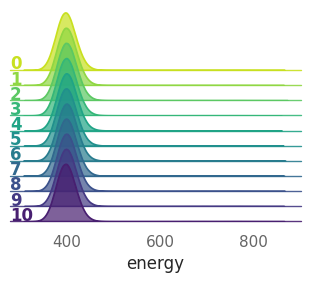

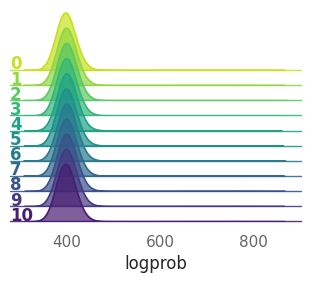

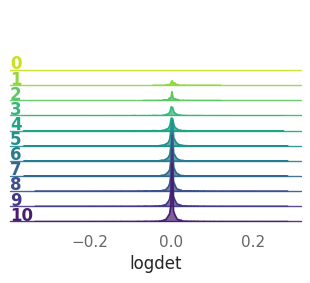

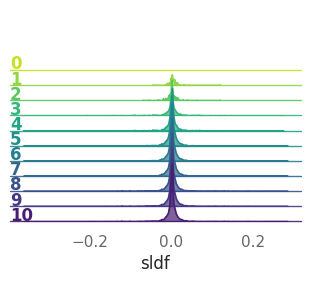

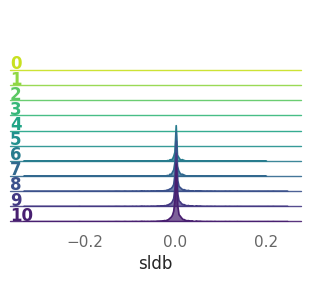

...

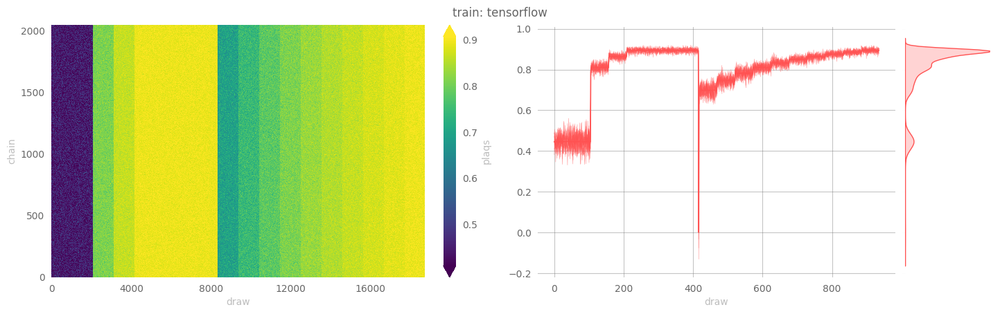

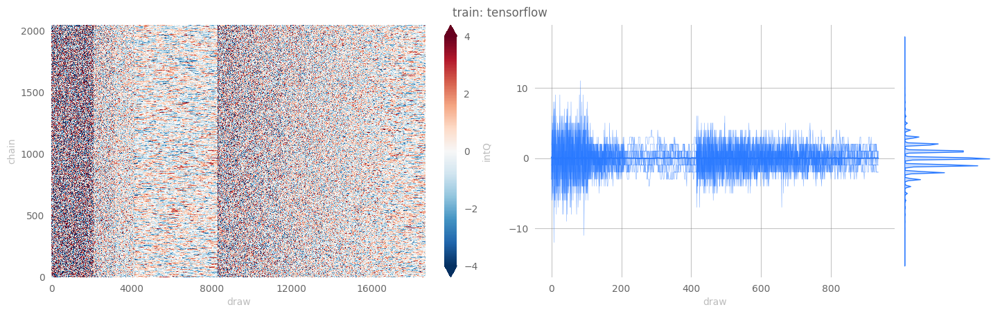

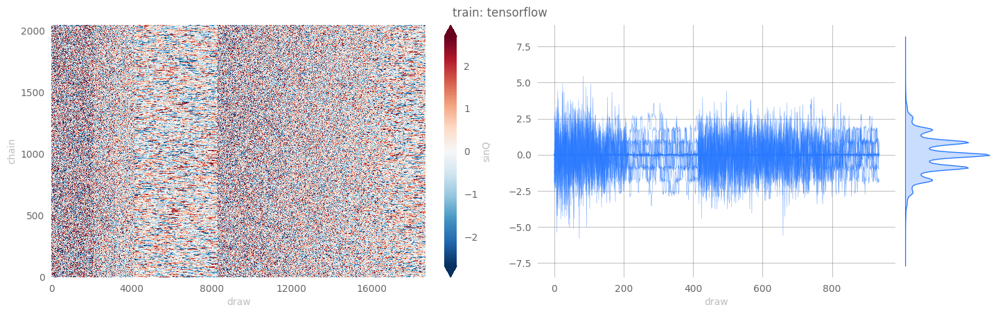

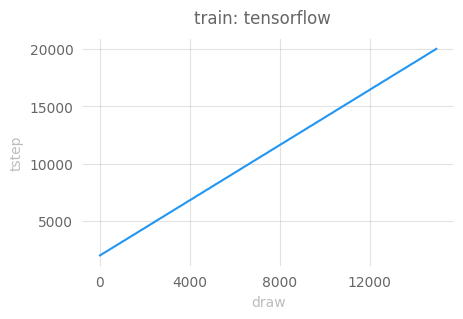

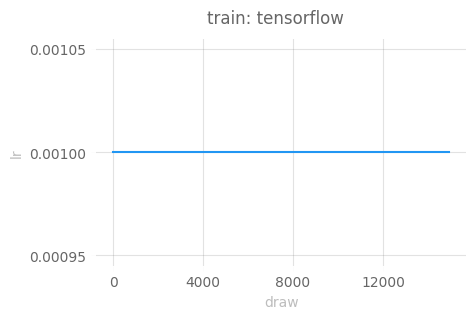

In [90]:
with sns.plotting_context("talk"):
    outputs['tensorflow']['train'] = tfExpU1.train(beta=beta)

[10/22/22 14:32:45] WARNING  x.shape (original): (2048, 2, 16, 16)

                    WARNING  x[:nchains].shape: (64, 2, 16, 16)

                    INFO     eps = None                                                      
                             beta = 5.0                                                      
                             nlog = 10                                                       
                             table = <rich.table.Table object at 0x7efc3aa65d00>             
                             nprint = 40                                                     
                             eval_steps = 2000                                               
                             nleapfrog = None

[10/22/22 14:32:50] INFO     estep=0   dt=5.7082 beta=5.0000 loss=-364.8961 dQsin=1.2152     
                             dQint=2.4844 energy=1536.7554 logprob=1536.7554 logdet=-0.0000  
                             sldf=-0.0000 sldb=0.0000 sld=-0.0000 xeps=0.1683 veps=0.1669    
                             acc=0.6407 sumlogdet=-0.0000 acc_mask=0.6094 plaqs=-0.0001      
                             intQ=0.6719 sinQ=0.3576

[10/22/22 14:32:56] INFO     estep=40  dt=0.0194 beta=5.0000 loss=6.0229 dQsin=0.1416        
                             dQint=0.0000 energy=399.6349 logprob=399.6349 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8836 sumlogdet=0.0000 acc_mask=0.8281 plaqs=0.8870        
                             intQ=0.3750 sinQ=0.3181

[10/22/22 14:32:58] INFO     estep=80  dt=0.0193 beta=5.0000 loss=0.6171 dQsin=0.1603        
                             dQint=0.0625 energy=393.7578 logprob=393.7578 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8655 sumlogdet=0.0000 acc_mask=0.9062 plaqs=0.8931        
                             intQ=0.2813 sinQ=0.2475

[10/22/22 14:33:00] INFO     estep=120 dt=0.0189 beta=5.0000 loss=-0.6545 dQsin=0.1804       
                             dQint=0.0469 energy=395.6706 logprob=395.6706 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8782 sumlogdet=0.0000 acc_mask=0.8906 plaqs=0.8929        
                             intQ=0.2344 sinQ=0.1898

[10/22/22 14:33:02] INFO     estep=160 dt=0.0634 beta=5.0000 loss=1.8182 dQsin=0.1310        
                             dQint=0.0000 energy=390.9874 logprob=390.9874 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8403 sumlogdet=0.0000 acc_mask=0.8438 plaqs=0.8931        
                             intQ=0.0313 sinQ=0.0468

[10/22/22 14:33:03] INFO     estep=200 dt=0.0191 beta=5.0000 loss=3.1714 dQsin=0.1416        
                             dQint=0.0469 energy=394.3769 logprob=394.3769 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8566 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8930        
                             intQ=-0.0469 sinQ=-0.0449

[10/22/22 14:33:04] INFO     estep=240 dt=0.0194 beta=5.0000 loss=1.6446 dQsin=0.1451        
                             dQint=0.0313 energy=392.5235 logprob=392.5235 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8568 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8922        
                             intQ=0.1875 sinQ=0.1700

[10/22/22 14:33:05] INFO     estep=280 dt=0.0189 beta=5.0000 loss=1.1389 dQsin=0.1316        
                             dQint=0.0156 energy=394.9808 logprob=394.9808 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8810 sumlogdet=0.0000 acc_mask=0.8125 plaqs=0.8919        
                             intQ=0.0938 sinQ=0.0937

[10/22/22 14:33:06] INFO     estep=320 dt=0.0189 beta=5.0000 loss=-2.1989 dQsin=0.1707       
                             dQint=0.0313 energy=393.0480 logprob=393.0480 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8491 sumlogdet=0.0000 acc_mask=0.8281 plaqs=0.8933        
                             intQ=-0.0156 sinQ=-0.0055

[10/22/22 14:33:07] INFO     estep=360 dt=0.0191 beta=5.0000 loss=3.7320 dQsin=0.1520        
                             dQint=0.0156 energy=393.5747 logprob=393.5747 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8961 sumlogdet=0.0000 acc_mask=0.8906 plaqs=0.8934        
                             intQ=0.0156 sinQ=0.0529

[10/22/22 14:33:08] INFO     estep=400 dt=0.0192 beta=5.0000 loss=3.1296 dQsin=0.1531        
                             dQint=0.0156 energy=393.1124 logprob=393.1124 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8724 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8941        
                             intQ=-0.0156 sinQ=-0.0286

[10/22/22 14:33:10] INFO     estep=440 dt=0.0190 beta=5.0000 loss=-2.3476 dQsin=0.1674       
                             dQint=0.0313 energy=394.3076 logprob=394.3076 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8703 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8930        
                             intQ=-0.0937 sinQ=-0.0849

[10/22/22 14:33:11] INFO     estep=480 dt=0.0191 beta=5.0000 loss=3.1422 dQsin=0.1332        
                             dQint=0.0000 energy=395.4604 logprob=395.4604 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8665 sumlogdet=0.0000 acc_mask=0.8438 plaqs=0.8920        
                             intQ=-0.1094 sinQ=-0.0708

[10/22/22 14:33:12] INFO     estep=520 dt=0.0191 beta=5.0000 loss=1.8503 dQsin=0.1220        
                             dQint=0.0156 energy=394.3044 logprob=394.3044 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8583 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8938        
                             intQ=0.0781 sinQ=0.0788

[10/22/22 14:33:13] INFO     estep=560 dt=0.0184 beta=5.0000 loss=-0.3627 dQsin=0.1601       
                             dQint=0.0313 energy=393.8037 logprob=393.8037 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8318 sumlogdet=0.0000 acc_mask=0.8906 plaqs=0.8933        
                             intQ=0.1094 sinQ=0.0977

[10/22/22 14:33:14] INFO     estep=600 dt=0.0191 beta=5.0000 loss=-1.4346 dQsin=0.1623       
                             dQint=0.0000 energy=393.3364 logprob=393.3364 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8724 sumlogdet=0.0000 acc_mask=0.8438 plaqs=0.8940        
                             intQ=0.1719 sinQ=0.1351

[10/22/22 14:33:15] INFO     estep=640 dt=0.0192 beta=5.0000 loss=-0.2304 dQsin=0.1326       
                             dQint=0.0000 energy=396.7447 logprob=396.7447 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8599 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8922        
                             intQ=0.1094 sinQ=0.0942

[10/22/22 14:33:16] INFO     estep=680 dt=0.0192 beta=5.0000 loss=1.7045 dQsin=0.1309        
                             dQint=0.0000 energy=396.3556 logprob=396.3556 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8393 sumlogdet=0.0000 acc_mask=0.8281 plaqs=0.8921        
                             intQ=0.0313 sinQ=0.0319

[10/22/22 14:33:17] INFO     estep=720 dt=0.0191 beta=5.0000 loss=4.1654 dQsin=0.1027        
                             dQint=0.0000 energy=392.7289 logprob=392.7289 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8423 sumlogdet=0.0000 acc_mask=0.8125 plaqs=0.8945        
                             intQ=-0.1094 sinQ=-0.1008

[10/22/22 14:33:18] INFO     estep=760 dt=0.0193 beta=5.0000 loss=3.0272 dQsin=0.1518        
                             dQint=0.0156 energy=393.2292 logprob=393.2292 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8462 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8934        
                             intQ=-0.0625 sinQ=-0.0709

[10/22/22 14:33:19] INFO     estep=800 dt=0.0195 beta=5.0000 loss=3.4287 dQsin=0.1198        
                             dQint=0.0000 energy=398.1534 logprob=398.1534 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8495 sumlogdet=0.0000 acc_mask=0.8438 plaqs=0.8920        
                             intQ=-0.0156 sinQ=-0.0422

[10/22/22 14:33:20] INFO     estep=840 dt=0.0193 beta=5.0000 loss=2.3982 dQsin=0.1298        
                             dQint=0.0000 energy=391.3661 logprob=391.3661 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8309 sumlogdet=0.0000 acc_mask=0.8281 plaqs=0.8939        
                             intQ=0.1719 sinQ=0.1585

[10/22/22 14:33:21] INFO     estep=880 dt=0.0194 beta=5.0000 loss=-0.2689 dQsin=0.1562       
                             dQint=0.0156 energy=391.3444 logprob=391.3444 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8712 sumlogdet=0.0000 acc_mask=0.9062 plaqs=0.8961        
                             intQ=0.1563 sinQ=0.1618

[10/22/22 14:33:22] INFO     estep=920 dt=0.0192 beta=5.0000 loss=8.4254 dQsin=0.1245        
                             dQint=0.0000 energy=393.5876 logprob=393.5876 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8499 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8938        
                             intQ=0.0781 sinQ=0.0404

[10/22/22 14:33:23] INFO     estep=960 dt=0.0193 beta=5.0000 loss=0.3486 dQsin=0.1388        
                             dQint=0.0313 energy=393.8589 logprob=393.8589 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8755 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8948        
                             intQ=0.0156 sinQ=-0.0088

[10/22/22 14:33:24] INFO     estep=1000 dt=0.0194 beta=5.0000 loss=1.3176 dQsin=0.1511       
                             dQint=0.0469 energy=393.2704 logprob=393.2704 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8801 sumlogdet=0.0000 acc_mask=0.9844 plaqs=0.8930        
                             intQ=0.1406 sinQ=0.1336

[10/22/22 14:33:25] INFO     estep=1040 dt=0.0194 beta=5.0000 loss=2.3982 dQsin=0.1451       
                             dQint=0.0313 energy=394.4445 logprob=394.4445 logdet=-0.0000    
                             sldf=0.0000 sldb=-0.0000 sld=-0.0000 xeps=0.1683 veps=0.1669    
                             acc=0.9019 sumlogdet=-0.0000 acc_mask=0.9062 plaqs=0.8940       
                             intQ=0.2500 sinQ=0.2073

[10/22/22 14:33:26] INFO     estep=1080 dt=0.0192 beta=5.0000 loss=4.4614 dQsin=0.1094       
                             dQint=0.0000 energy=394.6242 logprob=394.6242 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8526 sumlogdet=0.0000 acc_mask=0.7969 plaqs=0.8933        
                             intQ=0.2031 sinQ=0.1855

[10/22/22 14:33:27] INFO     estep=1120 dt=0.0192 beta=5.0000 loss=-0.3654 dQsin=0.1636      
                             dQint=0.0156 energy=397.0507 logprob=397.0507 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8672 sumlogdet=0.0000 acc_mask=0.9219 plaqs=0.8925        
                             intQ=0.1875 sinQ=0.1820

[10/22/22 14:33:28] INFO     estep=1160 dt=0.0192 beta=5.0000 loss=1.7126 dQsin=0.1455       
                             dQint=0.0313 energy=393.0448 logprob=393.0448 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8529 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8937        
                             intQ=0.1563 sinQ=0.1405

[10/22/22 14:33:29] INFO     estep=1200 dt=0.0191 beta=5.0000 loss=-2.5677 dQsin=0.1671      
                             dQint=0.0469 energy=394.1680 logprob=394.1680 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8887 sumlogdet=0.0000 acc_mask=0.9375 plaqs=0.8922        
                             intQ=0.1563 sinQ=0.1427

[10/22/22 14:33:30] INFO     estep=1240 dt=0.0192 beta=5.0000 loss=-1.4419 dQsin=0.1489      
                             dQint=0.0313 energy=393.0905 logprob=393.0905 logdet=0.0000     
                             sldf=0.0000 sldb=-0.0000 sld=0.0000 xeps=0.1683 veps=0.1669     
                             acc=0.8691 sumlogdet=-0.0000 acc_mask=0.8281 plaqs=0.8948       
                             intQ=0.1094 sinQ=0.1152

[10/22/22 14:33:31] INFO     estep=1280 dt=0.0430 beta=5.0000 loss=1.0251 dQsin=0.1378       
                             dQint=0.0313 energy=395.3618 logprob=395.3618 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8701 sumlogdet=0.0000 acc_mask=0.9062 plaqs=0.8928        
                             intQ=0.0781 sinQ=0.0625

[10/22/22 14:33:33] INFO     estep=1320 dt=0.0193 beta=5.0000 loss=2.3646 dQsin=0.1491       
                             dQint=0.0156 energy=392.3524 logprob=392.3524 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8912 sumlogdet=0.0000 acc_mask=0.9375 plaqs=0.8934        
                             intQ=-0.0312 sinQ=-0.0593

[10/22/22 14:33:34] INFO     estep=1360 dt=0.0194 beta=5.0000 loss=7.5208 dQsin=0.1432       
                             dQint=0.0156 energy=398.0507 logprob=398.0507 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8964 sumlogdet=0.0000 acc_mask=0.9219 plaqs=0.8938        
                             intQ=-0.1875 sinQ=-0.1564

[10/22/22 14:33:35] INFO     estep=1400 dt=0.0193 beta=5.0000 loss=4.6657 dQsin=0.1234       
                             dQint=0.0000 energy=395.9261 logprob=395.9261 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8432 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8918        
                             intQ=-0.2969 sinQ=-0.2718

[10/22/22 14:33:36] INFO     estep=1440 dt=0.0191 beta=5.0000 loss=1.2286 dQsin=0.1395       
                             dQint=0.0156 energy=397.8288 logprob=397.8288 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8569 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8921        
                             intQ=-0.2344 sinQ=-0.2083

[10/22/22 14:33:37] INFO     estep=1480 dt=0.0194 beta=5.0000 loss=5.2665 dQsin=0.1095       
                             dQint=0.0000 energy=394.2596 logprob=394.2596 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8669 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8929        
                             intQ=0.0781 sinQ=0.0764

[10/22/22 14:33:38] INFO     estep=1520 dt=0.0191 beta=5.0000 loss=5.2476 dQsin=0.1247       
                             dQint=0.0000 energy=395.1259 logprob=395.1259 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8964 sumlogdet=0.0000 acc_mask=0.9219 plaqs=0.8936        
                             intQ=0.0625 sinQ=0.0442

[10/22/22 14:33:39] INFO     estep=1560 dt=0.0191 beta=5.0000 loss=1.4980 dQsin=0.1363       
                             dQint=0.0313 energy=396.5924 logprob=396.5924 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8592 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8923        
                             intQ=0.0000 sinQ=-0.0256

[10/22/22 14:33:40] INFO     estep=1600 dt=0.0192 beta=5.0000 loss=-1.1300 dQsin=0.1602      
                             dQint=0.0156 energy=389.6542 logprob=389.6542 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8489 sumlogdet=0.0000 acc_mask=0.8125 plaqs=0.8956        
                             intQ=-0.0312 sinQ=-0.0013

[10/22/22 14:33:41] INFO     estep=1640 dt=0.0193 beta=5.0000 loss=8.3947 dQsin=0.1180       
                             dQint=0.0156 energy=395.8296 logprob=395.8296 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8443 sumlogdet=0.0000 acc_mask=0.8281 plaqs=0.8934        
                             intQ=0.3281 sinQ=0.2614

[10/22/22 14:33:42] INFO     estep=1680 dt=0.0198 beta=5.0000 loss=9.9414 dQsin=0.1352       
                             dQint=0.0000 energy=392.0815 logprob=392.0815 logdet=0.0000     
                             sldf=0.0000 sldb=-0.0000 sld=0.0000 xeps=0.1683 veps=0.1669     
                             acc=0.8860 sumlogdet=0.0000 acc_mask=0.9062 plaqs=0.8934        
                             intQ=0.1719 sinQ=0.1843

[10/22/22 14:33:43] INFO     estep=1720 dt=0.0193 beta=5.0000 loss=6.7044 dQsin=0.1048       
                             dQint=0.0000 energy=393.6468 logprob=393.6468 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8363 sumlogdet=0.0000 acc_mask=0.7812 plaqs=0.8920        
                             intQ=0.1875 sinQ=0.1592

[10/22/22 14:33:44] INFO     estep=1760 dt=0.0194 beta=5.0000 loss=1.3552 dQsin=0.1287       
                             dQint=0.0156 energy=392.5109 logprob=392.5109 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8573 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8929        
                             intQ=0.1719 sinQ=0.1288

[10/22/22 14:33:45] INFO     estep=1800 dt=0.0187 beta=5.0000 loss=2.3664 dQsin=0.1205       
                             dQint=0.0156 energy=394.6282 logprob=394.6282 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8431 sumlogdet=0.0000 acc_mask=0.7969 plaqs=0.8940        
                             intQ=-0.0469 sinQ=-0.0447

[10/22/22 14:33:46] INFO     estep=1840 dt=0.0194 beta=5.0000 loss=0.6398 dQsin=0.1538       
                             dQint=0.0313 energy=391.9736 logprob=391.9736 logdet=0.0000     
                             sldf=-0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669     
                             acc=0.8591 sumlogdet=0.0000 acc_mask=0.8750 plaqs=0.8939        
                             intQ=0.0469 sinQ=0.0617

[10/22/22 14:33:47] INFO     estep=1880 dt=0.0191 beta=5.0000 loss=4.3967 dQsin=0.1444       
                             dQint=0.0313 energy=396.9016 logprob=396.9016 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8392 sumlogdet=0.0000 acc_mask=0.8906 plaqs=0.8932        
                             intQ=0.0469 sinQ=0.0350

[10/22/22 14:33:48] INFO     estep=1920 dt=0.0193 beta=5.0000 loss=-0.3029 dQsin=0.1590      
                             dQint=0.0313 energy=394.7922 logprob=394.7922 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8578 sumlogdet=0.0000 acc_mask=0.9219 plaqs=0.8935        
                             intQ=-0.1562 sinQ=-0.1493

[10/22/22 14:33:49] INFO     estep=1960 dt=0.0193 beta=5.0000 loss=2.4713 dQsin=0.1325       
                             dQint=0.0156 energy=398.2717 logprob=398.2717 logdet=0.0000     
                             sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.1683 veps=0.1669      
                             acc=0.8844 sumlogdet=0.0000 acc_mask=0.8594 plaqs=0.8932        
                             intQ=0.0156 sinQ=0.0061

[10/22/22 14:33:53] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/eval/plots/ridgeplots/energy_ridgeplot.svg

[10/22/22 14:33:57] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/eval/plots/ridgeplots/logprob_ridgeplot.svg

[10/22/22 14:34:01] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/eval/plots/ridgeplots/logdet_ridgeplot.svg

[10/22/22 14:34:04] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/eval/plots/ridgeplots/sldf_ridgeplot.svg

[10/22/22 14:34:08] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/eval/plots/ridgeplots/sldb_ridgeplot.svg

[10/22/22 14:34:11] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/eval/plots/ridgeplots/sld_ridgeplot.svg

[10/22/22 14:34:23] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             22-083745/tensorflow/eval/data/eval_data.h5

                    WARNING  Unable to save as `.h5` file, falling back to `netCDF4`

                    INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             22-083745/tensorflow/eval/data/eval_dataset.nc

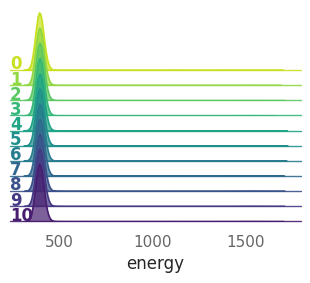

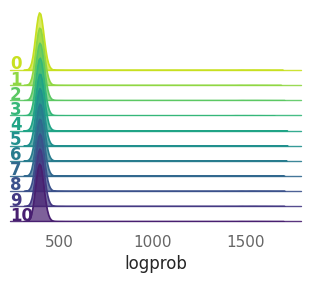

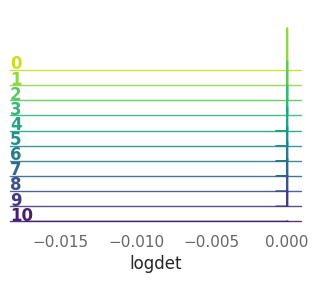

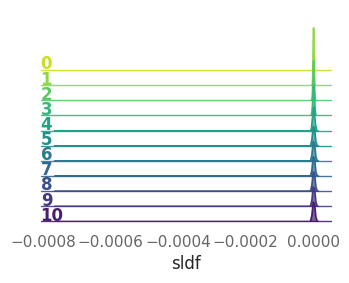

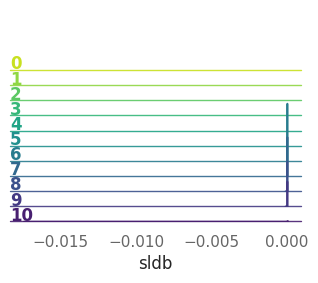

...

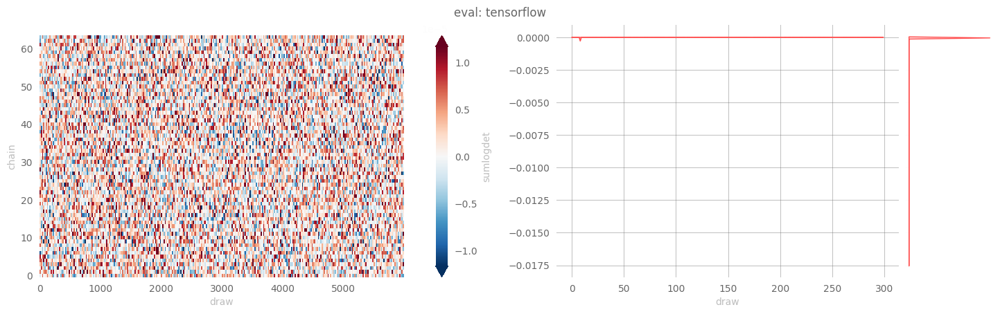

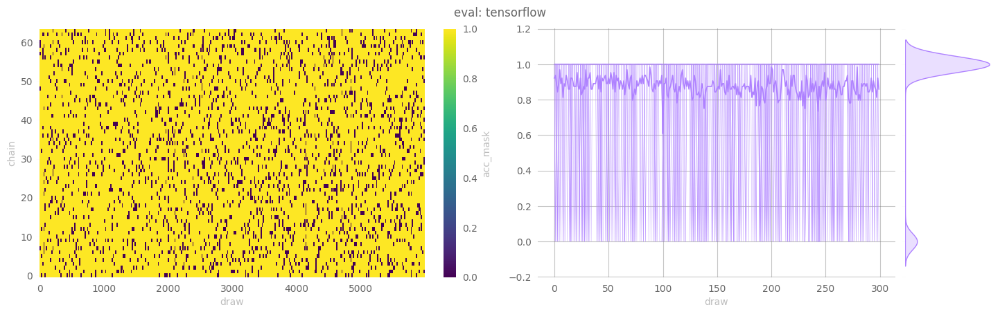

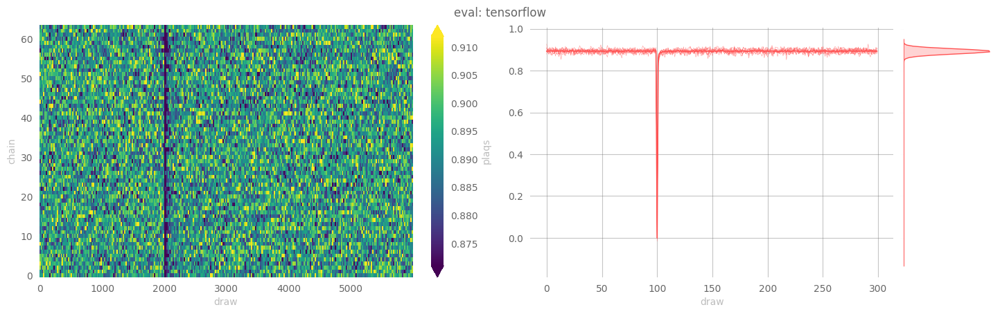

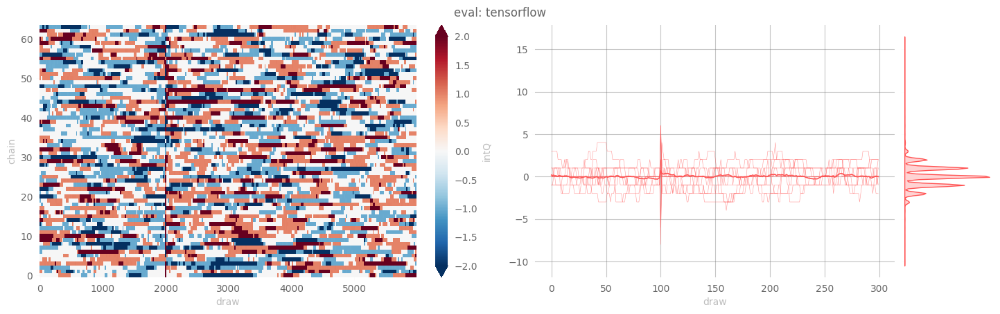

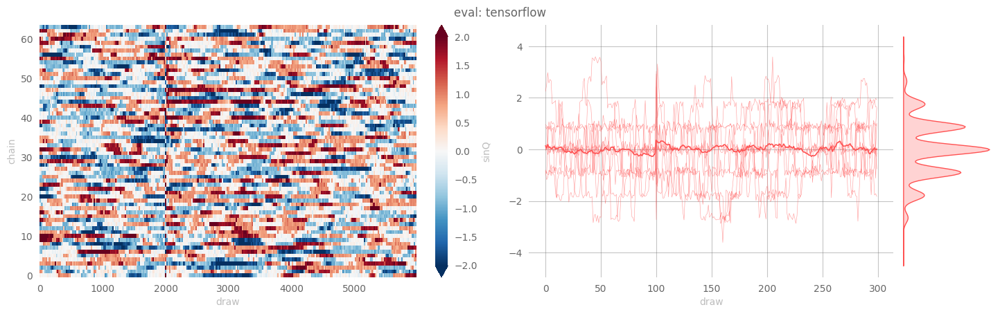

In [91]:
outputs['tensorflow']['eval'] = tfExpU1.evaluate(job_type='eval', nchains=64, therm_frac=0.25)

[10/22/22 14:34:43] WARNING  Step size `eps` not specified for HMC! Using default: 0.2000 for
                             generic HMC

                    WARNING  x.shape (original): (2048, 2, 16, 16)

                    WARNING  x[:nchains].shape: (64, 2, 16, 16)

                    INFO     eps = 0.2                                                       
                             beta = 5.0                                                      
                             nlog = 10                                                       
                             table = <rich.table.Table object at 0x7efc14d2a4c0>             
                             nprint = 40                                                     
                             eval_steps = 2000                                               
                             nleapfrog = 10

                    INFO     hstep=0   dt=0.0762 beta=5.0000 loss=-635.4563 dQsin=2.0313     
                             dQint=4.2344 energy=1506.3710 logprob=1506.3710 logdet=0.0000   
                             acc=1.0000 sumlogdet=0.0000 acc_mask=1.0000 plaqs=-0.0047       
                             intQ=-0.5938 sinQ=0.0678

[10/22/22 14:34:45] INFO     hstep=40  dt=0.0629 beta=5.0000 loss=20.8661 dQsin=0.0937       
                             dQint=0.0313 energy=413.7449 logprob=413.7449 logdet=0.0000     
                             acc=0.2660 sumlogdet=0.0000 acc_mask=0.3281 plaqs=0.8802        
                             intQ=-0.1563 sinQ=-0.1581

[10/22/22 14:34:48] INFO     hstep=80  dt=0.0628 beta=5.0000 loss=35.1659 dQsin=0.0322       
                             dQint=0.0000 energy=404.9001 logprob=404.9001 logdet=0.0000     
                             acc=0.2887 sumlogdet=0.0000 acc_mask=0.3281 plaqs=0.8867        
                             intQ=-0.1406 sinQ=-0.1175

[10/22/22 14:34:51] INFO     hstep=120 dt=0.0627 beta=5.0000 loss=30.4364 dQsin=0.0347       
                             dQint=0.0000 energy=396.0147 logprob=396.0147 logdet=0.0000     
                             acc=0.2247 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8911        
                             intQ=-0.1406 sinQ=-0.0948

[10/22/22 14:34:54] INFO     hstep=160 dt=0.0627 beta=5.0000 loss=37.6847 dQsin=0.0242       
                             dQint=0.0000 energy=398.4222 logprob=398.4222 logdet=0.0000     
                             acc=0.1396 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8925        
                             intQ=-0.1406 sinQ=-0.1224

[10/22/22 14:34:56] INFO     hstep=200 dt=0.0627 beta=5.0000 loss=45.9865 dQsin=0.0232       
                             dQint=0.0000 energy=397.0803 logprob=397.0803 logdet=0.0000     
                             acc=0.1451 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8933        
                             intQ=-0.0938 sinQ=-0.1129

[10/22/22 14:34:59] INFO     hstep=240 dt=0.0627 beta=5.0000 loss=37.9813 dQsin=0.0313       
                             dQint=0.0000 energy=397.6789 logprob=397.6789 logdet=0.0000     
                             acc=0.1416 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8917        
                             intQ=-0.1250 sinQ=-0.1153

[10/22/22 14:35:02] INFO     hstep=280 dt=0.0627 beta=5.0000 loss=36.0348 dQsin=0.0236       
                             dQint=0.0000 energy=395.2661 logprob=395.2661 logdet=0.0000     
                             acc=0.1710 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8920        
                             intQ=-0.1094 sinQ=-0.0741

[10/22/22 14:35:04] INFO     hstep=320 dt=0.0627 beta=5.0000 loss=28.2185 dQsin=0.0343       
                             dQint=0.0000 energy=396.3215 logprob=396.3215 logdet=0.0000     
                             acc=0.2083 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8905        
                             intQ=-0.0469 sinQ=-0.0259

[10/22/22 14:35:07] INFO     hstep=360 dt=0.0633 beta=5.0000 loss=39.4211 dQsin=0.0174       
                             dQint=0.0000 energy=402.3612 logprob=402.3612 logdet=0.0000     
                             acc=0.1494 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8919        
                             intQ=-0.0781 sinQ=-0.0719

[10/22/22 14:35:11] INFO     hstep=400 dt=0.0640 beta=5.0000 loss=44.2999 dQsin=0.0170       
                             dQint=0.0000 energy=399.3502 logprob=399.3502 logdet=0.0000     
                             acc=0.1712 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8928        
                             intQ=0.0312 sinQ=0.0227

[10/22/22 14:35:14] INFO     hstep=440 dt=0.0631 beta=5.0000 loss=35.5672 dQsin=0.0314       
                             dQint=0.0000 energy=398.0425 logprob=398.0425 logdet=0.0000     
                             acc=0.1982 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8932        
                             intQ=0.0469 sinQ=0.0504

[10/22/22 14:35:17] INFO     hstep=480 dt=0.0626 beta=5.0000 loss=33.3843 dQsin=0.0394       
                             dQint=0.0156 energy=396.5527 logprob=396.5527 logdet=0.0000     
                             acc=0.1775 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8935        
                             intQ=-0.0781 sinQ=-0.0503

[10/22/22 14:35:20] INFO     hstep=520 dt=0.0624 beta=5.0000 loss=32.1993 dQsin=0.0450       
                             dQint=0.0000 energy=397.8255 logprob=397.8255 logdet=0.0000     
                             acc=0.2004 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8929        
                             intQ=-0.0625 sinQ=-0.0479

[10/22/22 14:35:23] INFO     hstep=560 dt=0.0627 beta=5.0000 loss=39.2321 dQsin=0.0244       
                             dQint=0.0000 energy=399.6792 logprob=399.6792 logdet=0.0000     
                             acc=0.1848 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8930        
                             intQ=-0.0938 sinQ=-0.0716

[10/22/22 14:35:25] INFO     hstep=600 dt=0.0628 beta=5.0000 loss=43.5386 dQsin=0.0306       
                             dQint=0.0000 energy=401.7920 logprob=401.7920 logdet=0.0000     
                             acc=0.1936 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8911        
                             intQ=-0.0469 sinQ=-0.0299

[10/22/22 14:35:28] INFO     hstep=640 dt=0.0628 beta=5.0000 loss=37.7091 dQsin=0.0498       
                             dQint=0.0313 energy=400.8051 logprob=400.8051 logdet=0.0000     
                             acc=0.1528 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8914        
                             intQ=-0.1094 sinQ=-0.0814

[10/22/22 14:35:31] INFO     hstep=680 dt=0.0628 beta=5.0000 loss=35.4233 dQsin=0.0414       
                             dQint=0.0156 energy=397.7064 logprob=397.7064 logdet=0.0000     
                             acc=0.2220 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8910        
                             intQ=-0.1563 sinQ=-0.1489

[10/22/22 14:35:34] INFO     hstep=720 dt=0.0628 beta=5.0000 loss=40.8630 dQsin=0.0284       
                             dQint=0.0000 energy=399.3295 logprob=399.3295 logdet=0.0000     
                             acc=0.1666 sumlogdet=0.0000 acc_mask=0.1719 plaqs=0.8918        
                             intQ=-0.1562 sinQ=-0.1667

[10/22/22 14:35:36] INFO     hstep=760 dt=0.0633 beta=5.0000 loss=33.1705 dQsin=0.0225       
                             dQint=0.0156 energy=397.9994 logprob=397.9994 logdet=0.0000     
                             acc=0.1877 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8922        
                             intQ=-0.1875 sinQ=-0.1712

[10/22/22 14:35:39] INFO     hstep=800 dt=0.0625 beta=5.0000 loss=30.8382 dQsin=0.0302       
                             dQint=0.0000 energy=392.2014 logprob=392.2014 logdet=0.0000     
                             acc=0.2328 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8925        
                             intQ=-0.2188 sinQ=-0.2060

[10/22/22 14:35:42] INFO     hstep=840 dt=0.0627 beta=5.0000 loss=34.2493 dQsin=0.0501       
                             dQint=0.0000 energy=394.8004 logprob=394.8004 logdet=0.0000     
                             acc=0.1988 sumlogdet=0.0000 acc_mask=0.2812 plaqs=0.8929        
                             intQ=-0.1875 sinQ=-0.1819

[10/22/22 14:35:44] INFO     hstep=880 dt=0.0628 beta=5.0000 loss=42.2855 dQsin=0.0165       
                             dQint=0.0000 energy=397.7630 logprob=397.7630 logdet=0.0000     
                             acc=0.1364 sumlogdet=0.0000 acc_mask=0.1094 plaqs=0.8926        
                             intQ=-0.1406 sinQ=-0.1043

[10/22/22 14:35:47] INFO     hstep=920 dt=0.0627 beta=5.0000 loss=39.2165 dQsin=0.0357       
                             dQint=0.0156 energy=394.5963 logprob=394.5963 logdet=0.0000     
                             acc=0.1315 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8945        
                             intQ=-0.1563 sinQ=-0.1299

[10/22/22 14:35:50] INFO     hstep=960 dt=0.0627 beta=5.0000 loss=31.3347 dQsin=0.0398       
                             dQint=0.0156 energy=396.4902 logprob=396.4902 logdet=0.0000     
                             acc=0.2420 sumlogdet=0.0000 acc_mask=0.2188 plaqs=0.8922        
                             intQ=-0.1406 sinQ=-0.1134

[10/22/22 14:35:53] INFO     hstep=1000 dt=0.0626 beta=5.0000 loss=33.2872 dQsin=0.0476      
                             dQint=0.0000 energy=393.8771 logprob=393.8771 logdet=0.0000     
                             acc=0.2860 sumlogdet=0.0000 acc_mask=0.2812 plaqs=0.8927        
                             intQ=-0.2031 sinQ=-0.2015

[10/22/22 14:35:55] INFO     hstep=1040 dt=0.0625 beta=5.0000 loss=38.3924 dQsin=0.0511      
                             dQint=0.0156 energy=397.8794 logprob=397.8794 logdet=0.0000     
                             acc=0.1620 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8931        
                             intQ=-0.2500 sinQ=-0.2136

[10/22/22 14:35:58] INFO     hstep=1080 dt=0.0626 beta=5.0000 loss=29.7242 dQsin=0.0474      
                             dQint=0.0156 energy=395.8272 logprob=395.8272 logdet=0.0000     
                             acc=0.1876 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8931        
                             intQ=-0.2656 sinQ=-0.2336

[10/22/22 14:36:01] INFO     hstep=1120 dt=0.0630 beta=5.0000 loss=48.0479 dQsin=0.0194      
                             dQint=0.0000 energy=396.4604 logprob=396.4604 logdet=0.0000     
                             acc=0.1483 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8940        
                             intQ=-0.2031 sinQ=-0.1850

[10/22/22 14:36:03] INFO     hstep=1160 dt=0.0629 beta=5.0000 loss=35.5228 dQsin=0.0612      
                             dQint=0.0313 energy=396.5298 logprob=396.5298 logdet=0.0000     
                             acc=0.2015 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8942        
                             intQ=-0.2187 sinQ=-0.1927

[10/22/22 14:36:06] INFO     hstep=1200 dt=0.0628 beta=5.0000 loss=29.2185 dQsin=0.0347      
                             dQint=0.0000 energy=393.6400 logprob=393.6400 logdet=0.0000     
                             acc=0.1915 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8929        
                             intQ=-0.2656 sinQ=-0.2401

[10/22/22 14:36:09] INFO     hstep=1240 dt=0.0628 beta=5.0000 loss=29.6339 dQsin=0.0582      
                             dQint=0.0156 energy=397.8547 logprob=397.8547 logdet=0.0000     
                             acc=0.2529 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8917        
                             intQ=-0.2188 sinQ=-0.2046

[10/22/22 14:36:11] INFO     hstep=1280 dt=0.0628 beta=5.0000 loss=37.2300 dQsin=0.0312      
                             dQint=0.0000 energy=395.5317 logprob=395.5317 logdet=0.0000     
                             acc=0.2205 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8936        
                             intQ=-0.2031 sinQ=-0.2019

[10/22/22 14:36:14] INFO     hstep=1320 dt=0.0627 beta=5.0000 loss=33.7832 dQsin=0.0323      
                             dQint=0.0156 energy=397.7203 logprob=397.7203 logdet=0.0000     
                             acc=0.2288 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8925        
                             intQ=-0.2188 sinQ=-0.1997

[10/22/22 14:36:17] INFO     hstep=1360 dt=0.0630 beta=5.0000 loss=32.7425 dQsin=0.0209      
                             dQint=0.0156 energy=395.0083 logprob=395.0083 logdet=0.0000     
                             acc=0.1680 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8935        
                             intQ=-0.2500 sinQ=-0.1960

[10/22/22 14:36:19] INFO     hstep=1400 dt=0.0628 beta=5.0000 loss=32.3739 dQsin=0.0308      
                             dQint=0.0156 energy=395.3843 logprob=395.3843 logdet=0.0000     
                             acc=0.1521 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8937        
                             intQ=-0.2031 sinQ=-0.1801

[10/22/22 14:36:22] INFO     hstep=1440 dt=0.0627 beta=5.0000 loss=35.9173 dQsin=0.0308      
                             dQint=0.0000 energy=397.6726 logprob=397.6726 logdet=0.0000     
                             acc=0.1670 sumlogdet=0.0000 acc_mask=0.2188 plaqs=0.8926        
                             intQ=-0.1094 sinQ=-0.1148

[10/22/22 14:36:25] INFO     hstep=1480 dt=0.0626 beta=5.0000 loss=24.1811 dQsin=0.0697      
                             dQint=0.0313 energy=396.7589 logprob=396.7589 logdet=0.0000     
                             acc=0.2430 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8918        
                             intQ=-0.0625 sinQ=-0.0430

[10/22/22 14:36:27] INFO     hstep=1520 dt=0.0625 beta=5.0000 loss=32.9309 dQsin=0.0353      
                             dQint=0.0156 energy=394.5320 logprob=394.5320 logdet=0.0000     
                             acc=0.2344 sumlogdet=0.0000 acc_mask=0.2344 plaqs=0.8946        
                             intQ=-0.0156 sinQ=-0.0167

[10/22/22 14:36:30] INFO     hstep=1560 dt=0.0628 beta=5.0000 loss=32.6904 dQsin=0.0613      
                             dQint=0.0313 energy=399.1002 logprob=399.1002 logdet=0.0000     
                             acc=0.1488 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8931        
                             intQ=-0.0469 sinQ=-0.0137

[10/22/22 14:36:33] INFO     hstep=1600 dt=0.0629 beta=5.0000 loss=28.2669 dQsin=0.0449      
                             dQint=0.0156 energy=395.0451 logprob=395.0451 logdet=0.0000     
                             acc=0.2270 sumlogdet=0.0000 acc_mask=0.2188 plaqs=0.8942        
                             intQ=-0.0625 sinQ=-0.0587

[10/22/22 14:36:35] INFO     hstep=1640 dt=0.0630 beta=5.0000 loss=35.8613 dQsin=0.0245      
                             dQint=0.0000 energy=398.1472 logprob=398.1472 logdet=0.0000     
                             acc=0.2152 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8930        
                             intQ=-0.0781 sinQ=-0.0591

[10/22/22 14:36:38] INFO     hstep=1680 dt=0.0628 beta=5.0000 loss=37.5485 dQsin=0.0183      
                             dQint=0.0000 energy=392.7698 logprob=392.7698 logdet=0.0000     
                             acc=0.1554 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8957        
                             intQ=-0.0625 sinQ=-0.0515

[10/22/22 14:36:41] INFO     hstep=1720 dt=0.0626 beta=5.0000 loss=34.1720 dQsin=0.0117      
                             dQint=0.0000 energy=396.0994 logprob=396.0994 logdet=0.0000     
                             acc=0.1556 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8924        
                             intQ=-0.0156 sinQ=-0.0260

[10/22/22 14:36:43] INFO     hstep=1760 dt=0.0628 beta=5.0000 loss=32.1425 dQsin=0.0518      
                             dQint=0.0156 energy=398.3612 logprob=398.3612 logdet=0.0000     
                             acc=0.2190 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8920        
                             intQ=0.1406 sinQ=0.1524

[10/22/22 14:36:46] INFO     hstep=1800 dt=0.0627 beta=5.0000 loss=34.8741 dQsin=0.0259      
                             dQint=0.0000 energy=399.4893 logprob=399.4893 logdet=0.0000     
                             acc=0.1899 sumlogdet=0.0000 acc_mask=0.1562 plaqs=0.8925        
                             intQ=0.1250 sinQ=0.1226

[10/22/22 14:36:49] INFO     hstep=1840 dt=0.0627 beta=5.0000 loss=46.3119 dQsin=0.0139      
                             dQint=0.0000 energy=397.2596 logprob=397.2596 logdet=0.0000     
                             acc=0.1893 sumlogdet=0.0000 acc_mask=0.1719 plaqs=0.8940        
                             intQ=0.2031 sinQ=0.1727

[10/22/22 14:36:51] INFO     hstep=1880 dt=0.0628 beta=5.0000 loss=37.1368 dQsin=0.0280      
                             dQint=0.0156 energy=398.4873 logprob=398.4873 logdet=0.0000     
                             acc=0.1643 sumlogdet=0.0000 acc_mask=0.1406 plaqs=0.8934        
                             intQ=0.1250 sinQ=0.1117

[10/22/22 14:36:54] INFO     hstep=1920 dt=0.0627 beta=5.0000 loss=34.8501 dQsin=0.0356      
                             dQint=0.0156 energy=394.9337 logprob=394.9337 logdet=0.0000     
                             acc=0.1516 sumlogdet=0.0000 acc_mask=0.1094 plaqs=0.8936        
                             intQ=0.1094 sinQ=0.0994

[10/22/22 14:36:57] INFO     hstep=1960 dt=0.0625 beta=5.0000 loss=40.7843 dQsin=0.0404      
                             dQint=0.0156 energy=398.5165 logprob=398.5165 logdet=0.0000     
                             acc=0.1830 sumlogdet=0.0000 acc_mask=0.2031 plaqs=0.8934        
                             intQ=0.1094 sinQ=0.1111

[10/22/22 14:37:03] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/hmc/plots/ridgeplots/energy_ridgeplot.svg

[10/22/22 14:37:07] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/hmc/plots/ridgeplots/logprob_ridgeplot.svg

[10/22/22 14:37:10] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             2-083745/tensorflow/hmc/plots/ridgeplots/logdet_ridgeplot.svg

[10/22/22 14:37:19] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             22-083745/tensorflow/hmc/data/hmc_data.h5

                    WARNING  Unable to save as `.h5` file, falling back to `netCDF4`

                    INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             22-083745/tensorflow/hmc/data/hmc_dataset.nc

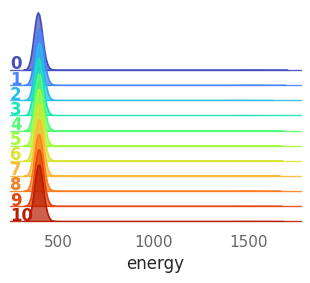

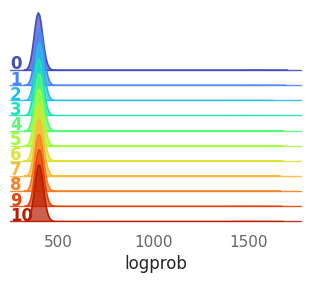

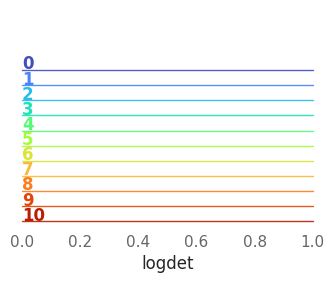

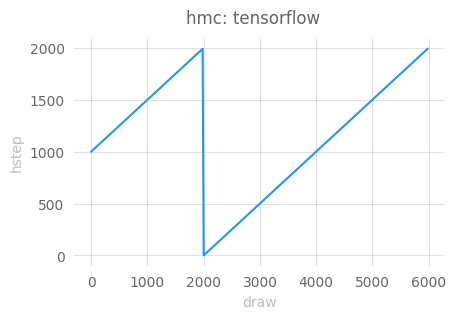

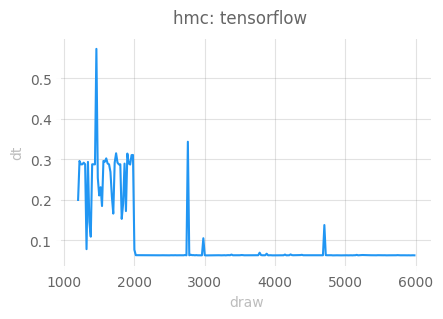

...

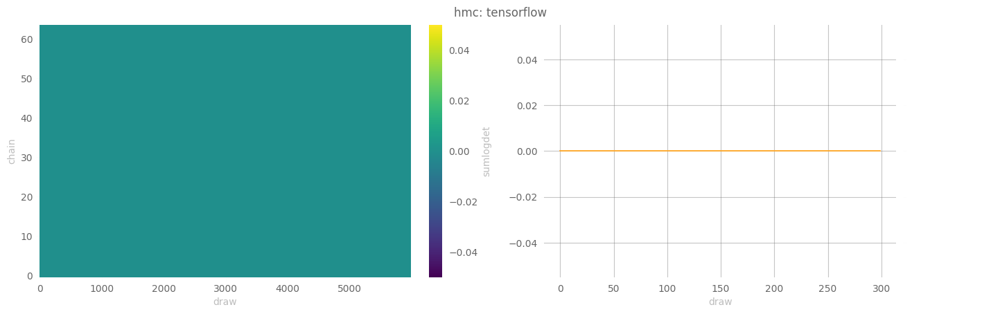

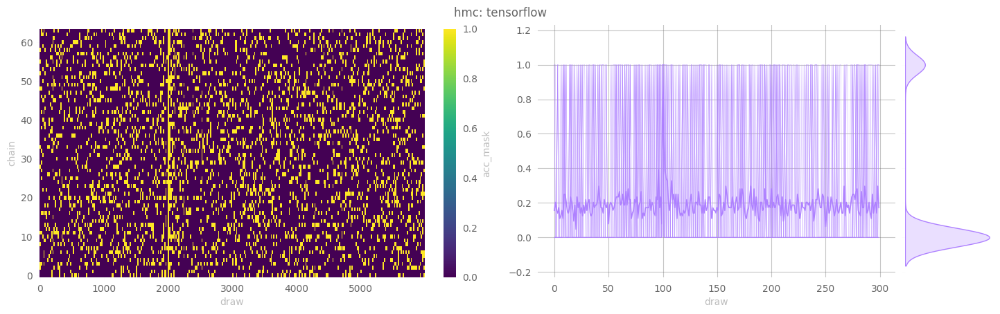

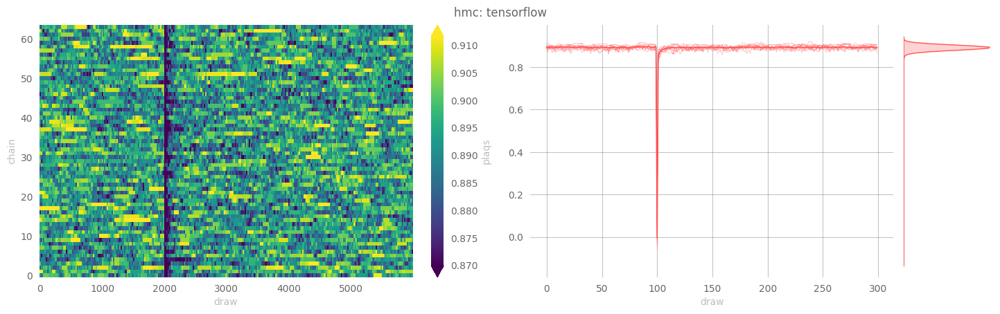

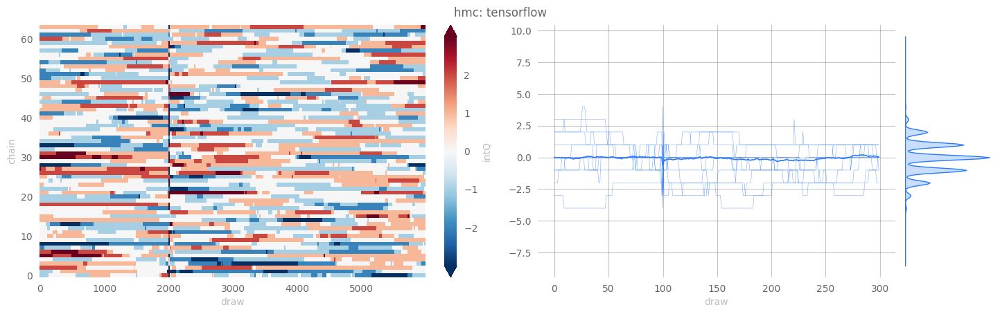

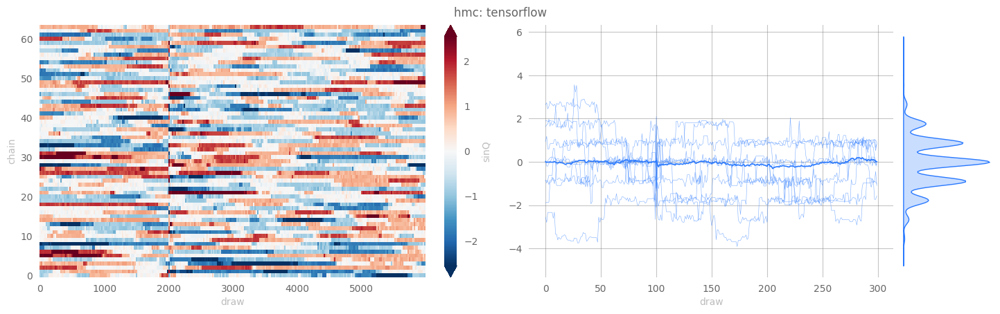

In [92]:
outputs['tensorflow']['hmc'] = tfExpU1.evaluate(job_type='hmc', nchains=64, therm_frac=0.25)

In [93]:
dsets = {}
fws = ['pt', 'tf']
modes = ['train', 'eval', 'hmc']
for fw in fws:
    dsets[fw] = {}
    for mode in modes:
        hist = None
        if fw == 'pt':
            hist = ptExpU1.trainer.histories.get(mode, None)
        elif fw == 'tf':
            hist = tfExpU1.trainer.histories.get(mode, None)
        if hist is not None:
            log.info(f'Getting dataset for {fw}: {mode}')
            dsets[fw][mode] = hist.get_dataset()

[10/22/22 14:42:20] INFO     Getting dataset for pt: train

                    INFO     Getting dataset for pt: eval

                    INFO     Getting dataset for pt: hmc

                    INFO     Getting dataset for tf: train

[10/22/22 14:42:21] INFO     Getting dataset for tf: eval

                    INFO     Getting dataset for tf: hmc

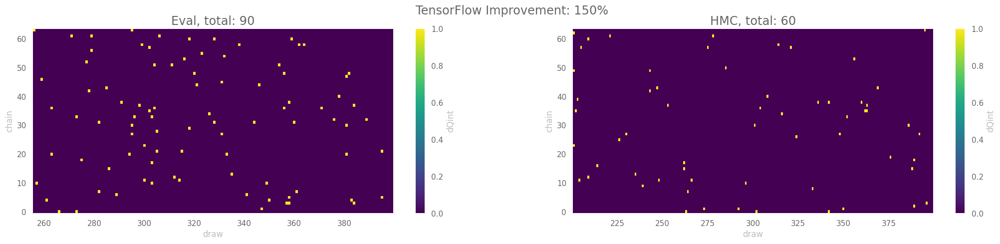

In [99]:
sns.set_context('notebook')
ndraws = len(dsets['tf']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.33 * ndraws)

dqe = get_thermalized_configs(dsets['tf']['eval']['dQint'])
dqh = get_thermalized_configs(dsets['tf']['hmc']['dQint'])

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');
_ = fig.suptitle(fr'TensorFlow Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large')

# Comparisons

We can measure our models' performance explicitly by looking at the average tunneling rate, $\delta Q_{\mathbb{Z}}$, for our **trained model** and comparing it against generic HMC.

Recall,

$$\delta Q_{\mathbb{Z}} := \big|Q^{(i+1)}_{\mathbb{Z}} - Q^{(i)}_{\mathbb{Z}}\big|$$

where a **higher** value of $\delta Q_{\mathbb{Z}}$ corresponds to **better** tunneling of the topological charge, $Q_{\mathbb{Z}}$.

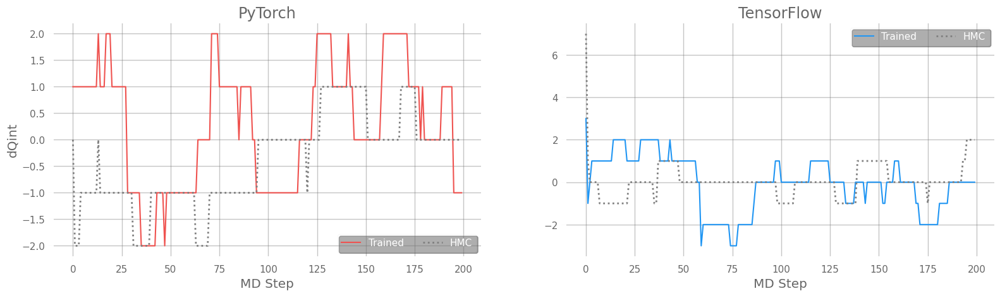

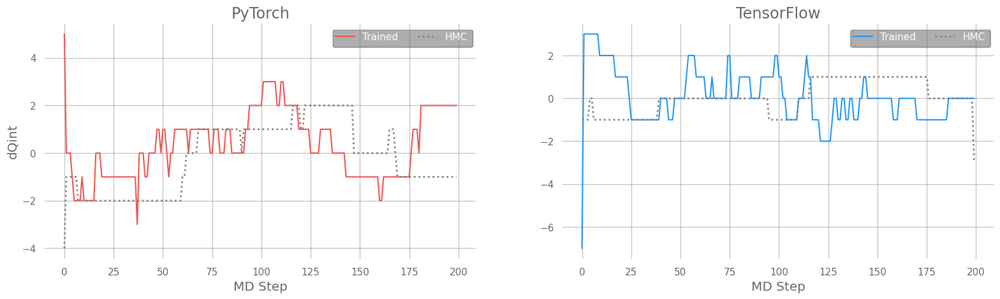

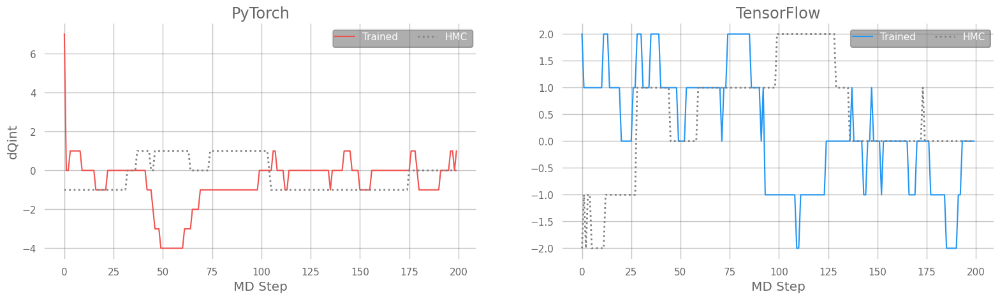

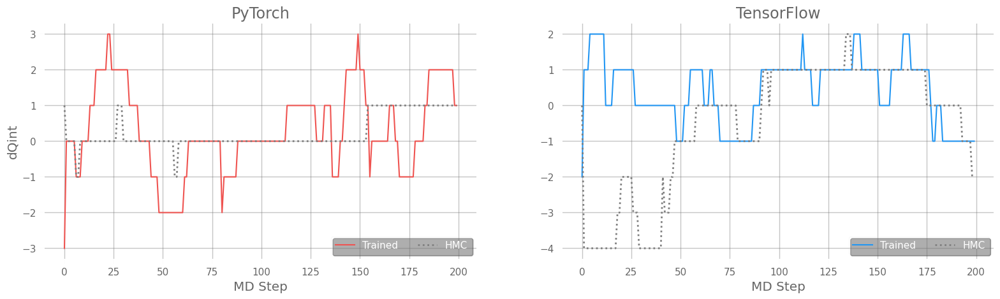

In [40]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS

import seaborn as sns
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']

for idx in range(4):
    fig, (ax, ax1) = plt.subplots(
        ncols=2,
        #nrows=4,
        figsize=(3. * figsize[0], figsize[1]),
    )
    #for (ax, ax1) in zip(axes[1:], axes[:-1]):
    _ = ax.plot(
        dsets['pt']['eval'].intQ[idx],  # .dQint.mean('chain')[100:],
        color=COLORS['red'],
        ls='-',
        label='Trained',
        lw=1.5,
    );

    _ = ax.plot(
        dsets['pt']['hmc'].intQ[idx],  # .dQint.mean('chain')[100:],
        ls=':',
        label='HMC',
        color='#808080',
        zorder=5,
        lw=2.0,
    );

    _ = ax1.plot(
        dsets['tf']['eval'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color=COLORS['blue'],
        ls='-',
        label='Trained',
        lw=1.5,

    );
    _ = ax1.plot(
        dsets['tf']['hmc'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color='#808080',
        ls=':',
        label='HMC',
        zorder=5,
        lw=2.0,
    );
    _ = ax.set_title('PyTorch', fontsize='x-large')
    _ = ax1.set_title('TensorFlow', fontsize='x-large')
    #_ = ax1.set_ylim(ax.get_ylim())
    _ = ax.grid(True, alpha=0.4)
    _ = ax1.grid(True, alpha=0.4)
    _ = ax.set_xlabel('MD Step', fontsize='large')
    _ = ax1.set_xlabel('MD Step', fontsize='large')
    _ = ax.set_ylabel('dQint', fontsize='large')
    _ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)
    _ = ax1.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)

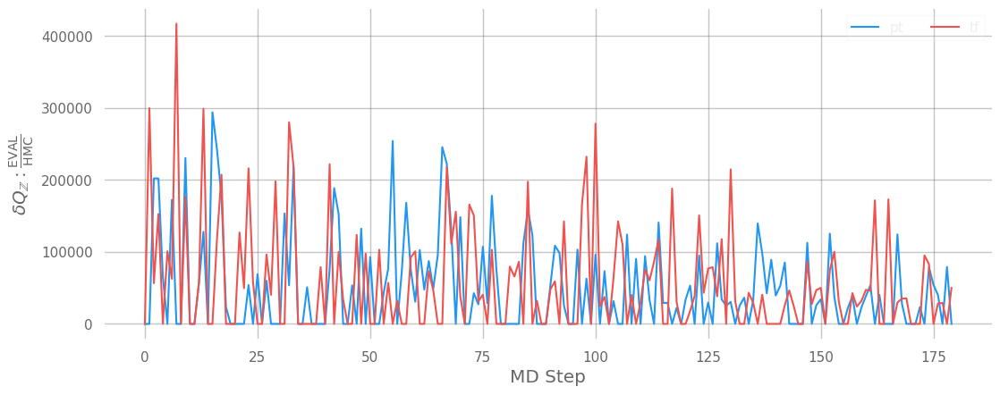

In [42]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS
set_plot_style()

figsize = plt.rcParams['figure.figsize']
plt.rcParams['axes.linewidth'] = 2.0

# Drop first 10% to account for thermalization
drop = int(0.1 * dsets['pt']['eval'].dQint.shape[1])


import xarray as xr
from l2hmc.utils.history import BaseHistory


def plot_dQ_improvement(
        data: dict[str, xr.Dataset],
        drop_percent: float = 0.1,
        fig: Optional[plt.Figure] = None,
        ax: Optional[plt.Axes] = None,
        xlabel: Optional[str] = None,
        ylabel: Optional[str] = None,
        title: Optional[str] = None,
        **kwargs,
) -> tuple[plt.Figure, plt.Axes]:
    assert (
        'eval' in data.keys()
        and 'hmc' in data.keys()
    )
    fig = plt.gcf() if fig is None else fig
    ax = plt.gca() if ax is None else ax
    if fig is None or ax is None:
        fig, ax = plt.subplots()
        
    dQint_eval = data['eval'].dQint
    dQint_hmc = data['hmc'].dQint
    improvement = (
        data['eval'].dQint[:,]
    )
        
        
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']
        


fig, ax = plt.subplots(
    #ncols=2,
    figsize=(2. * figsize[0], figsize[1]),
)

dQpt = (
    dsets['pt']['eval'].dQint[:, drop:].mean('chain') 
    / dsets['pt']['hmc'].dQint[:, drop:].mean('chain')
)
dQtf = (
    dsets['tf']['eval'].dQint[:, drop:].mean('chain') 
    / dsets['tf']['hmc'].dQint[:, drop:].mean('chain')
)
_ = ax.plot(dQpt[::1], color=COLORS['blue'], label='pt');
_ = ax.plot(dQtf[::1], color=COLORS['red'], label='tf');
ylabel = r'$\delta Q_{\mathbb{Z}}: \frac{\mathrm{EVAL}}{\mathrm{HMC}}$'
_ = ax.set_xlabel('MD Step', fontsize='large');
#_ = ax.set_yscale('log');
_ = ax.set_ylabel(ylabel, fontsize='large')
_ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#EFEFEF')#, shadow=True);#, textcolor='#EFEFEF');
_ = ax.grid(True, which='both', alpha=0.4);

# $SU(3)$

In [ ]:
ptExpSU3 = get_experiment(
    overrides=[
        *defaults_su3,
        'framework=pytorch',
    ]
)

In [ ]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
    ]
)

tfExpSU3 = get_experiment(
    overrides=[
        *defaults_su3,
        'framework=tensorflow',
    ]
)

tfObjsU1 = tfExpU1.build(init_wandb=False, init_aim=True)
tfObjsSU3 = tfExpSU3.build(init_wandb=False, init_aim=True)